In [22]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import norm, probplot
pd.options.mode.chained_assignment = None
import warnings
warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=UserWarning)
from sklearn.linear_model import LinearRegression, ElasticNet, LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
from sklearn.preprocessing import StandardScaler, OrdinalEncoder
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.feature_selection import mutual_info_classif
from sklearn.datasets import load_digits
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from sklearn.svm import SVC
from sklearn.metrics import roc_auc_score, f1_score, recall_score, precision_score, roc_curve, precision_recall_curve, confusion_matrix
import shap
import lime
import lime.lime_tabular

## 1. Data Exploration and Preprocessing

In [23]:
ckd_df0 = pd.read_excel('CKD dataset.xlsx')
ckd_df0.set_index('StudyID', inplace=True)
ckd_df0.columns

Index(['Gender', 'AgeBaseline', 'Age.3.categories', 'HistoryDiabetes',
       'HistoryCHD', 'HistoryVascular', 'HistorySmoking', 'HistoryHTN ',
       'HistoryDLD', 'HistoryObesity', 'DLDmeds', 'DMmeds', 'HTNmeds',
       'ACEIARB', 'CholesterolBaseline', 'TriglyceridesBaseline', 'HgbA1C',
       'CreatnineBaseline', 'eGFRBaseline', 'sBPBaseline', 'dBPBaseline',
       'BMIBaseline', 'TimeToEventMonths', 'EventCKD35'],
      dtype='object')

In [24]:
ckd_df = pd.read_excel('CKD dataset.xlsx')
ckd_df.set_index('StudyID', inplace=True)
ckd_df.head()

,Gender,AgeBaseline,Age.3.categories,HistoryDiabetes,HistoryCHD,HistoryVascular,HistorySmoking,HistoryHTN,HistoryDLD,HistoryObesity,...,CholesterolBaseline,TriglyceridesBaseline,HgbA1C,CreatnineBaseline,eGFRBaseline,sBPBaseline,dBPBaseline,BMIBaseline,TimeToEventMonths,EventCKD35
StudyID,,,,,,,,,,,,,,,,,,,,,
1,0,64,1,0,0,0,0,1,1,1,...,4.8,0.92,5.90,59.0,93.319050,144,87,40.161842,98,0
2,0,52,1,0,0,0,0,1,1,1,...,6.4,1.84,6.00,52.0,105.833836,148,91,44.536941,106,0
3,0,56,1,0,0,0,0,1,1,1,...,6.4,1.75,5.90,57.0,99.839823,149,86,40.543437,88,0
4,0,58,1,0,0,0,0,0,1,1,...,5.1,1.22,5.50,65.0,90.315159,116,68,32.025584,103,0
5,0,63,1,1,0,0,0,1,1,1,...,5.0,1.11,7.46,70.0,79.725199,132,63,30.757401,105,0


In [25]:
ckd_df.columns

Index(['Gender', 'AgeBaseline', 'Age.3.categories', 'HistoryDiabetes',
       'HistoryCHD', 'HistoryVascular', 'HistorySmoking', 'HistoryHTN ',
       'HistoryDLD', 'HistoryObesity', 'DLDmeds', 'DMmeds', 'HTNmeds',
       'ACEIARB', 'CholesterolBaseline', 'TriglyceridesBaseline', 'HgbA1C',
       'CreatnineBaseline', 'eGFRBaseline', 'sBPBaseline', 'dBPBaseline',
       'BMIBaseline', 'TimeToEventMonths', 'EventCKD35'],
      dtype='object')

In [26]:
ckd_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 491 entries, 1 to 968
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Gender                 491 non-null    int64  
 1   AgeBaseline            491 non-null    int64  
 2   Age.3.categories       491 non-null    int64  
 3   HistoryDiabetes        491 non-null    int64  
 4   HistoryCHD             491 non-null    int64  
 5   HistoryVascular        491 non-null    int64  
 6   HistorySmoking         491 non-null    int64  
 7   HistoryHTN             491 non-null    int64  
 8   HistoryDLD             491 non-null    int64  
 9   HistoryObesity         491 non-null    int64  
 10  DLDmeds                491 non-null    int64  
 11  DMmeds                 491 non-null    int64  
 12  HTNmeds                491 non-null    int64  
 13  ACEIARB                491 non-null    int64  
 14  CholesterolBaseline    491 non-null    float64
 15  Triglycerid

In [27]:
# Understanding the rows with missing values
ckd_df[ckd_df['TriglyceridesBaseline'].isnull() | ckd_df['HgbA1C'].isnull()]

,Gender,AgeBaseline,Age.3.categories,HistoryDiabetes,HistoryCHD,HistoryVascular,HistorySmoking,HistoryHTN,HistoryDLD,HistoryObesity,...,CholesterolBaseline,TriglyceridesBaseline,HgbA1C,CreatnineBaseline,eGFRBaseline,sBPBaseline,dBPBaseline,BMIBaseline,TimeToEventMonths,EventCKD35
StudyID,,,,,,,,,,,,,,,,,,,,,
231,1,48,0,0,0,0,0,1,1,0,...,3.40,1.5700,NaN,91.0,85.606333,180,100,27.979422,41,0
279,0,59,1,0,0,0,0,1,0,0,...,6.10,1.1100,NaN,53.0,100.126173,151,74,24.761679,0,0
280,1,58,1,0,0,0,0,0,1,0,...,5.10,0.6000,NaN,71.0,98.329451,124,65,23.836735,83,1
326,1,59,1,0,0,0,1,0,1,0,...,6.40,1.2500,NaN,47.0,115.682543,128,74,18.507766,66,0
359,0,55,1,0,0,0,0,0,0,0,...,5.90,NaN,5.4,63.0,95.790498,122,77,28.065417,88,0
379,0,50,1,0,0,0,0,0,0,0,...,3.60,0.2800,NaN,49.0,109.450218,125,75,22.518210,104,0
413,0,29,0,0,0,0,0,1,0,0,...,4.00,NaN,5.2,56.0,121.395632,103,60,19.098346,64,0
428,0,37,0,0,0,0,0,0,0,0,...,5.40,NaN,4.4,63.0,108.701605,118,79,23.191095,77,0
430,0,39,0,0,0,0,0,1,0,0,...,3.95,NaN,5.6,30.0,138.955747,117,68,21.183281,104,0


##### Since the rows with missing values in column hgbA1C contain 2 patients diagnosed with CKD (EventCKD35), we won't drop the rows with missing values in this column and we'll find a way to fill missing values. However, for column TriglyceridesBaseline, it represents only 5 rows and none of them have the relevant variable we try to predict, therefore we will drop the rows with missing values in this column.
##### To take care of missing values in hgba1c, we'll first understand if those columns are normally distributed to understand if filling values based on mean is relevant.

In [28]:
# Drop rows with missing values in 'TriglyceridesBaseline'
ckd_df.dropna(subset=['TriglyceridesBaseline'], inplace=True)

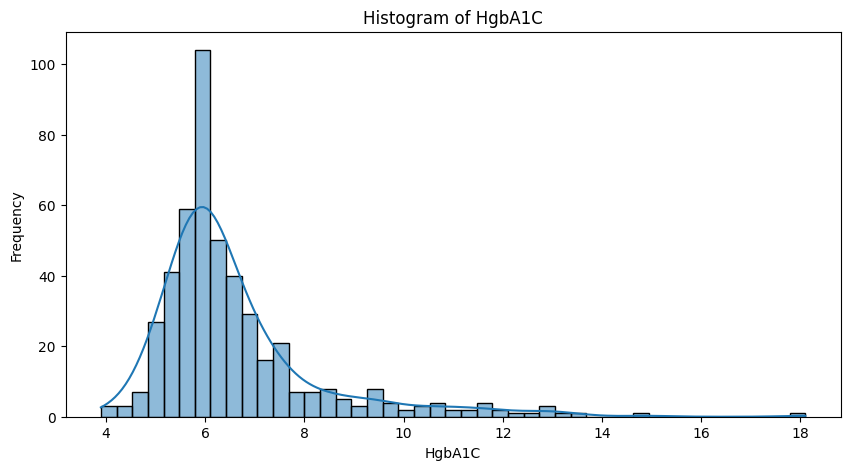

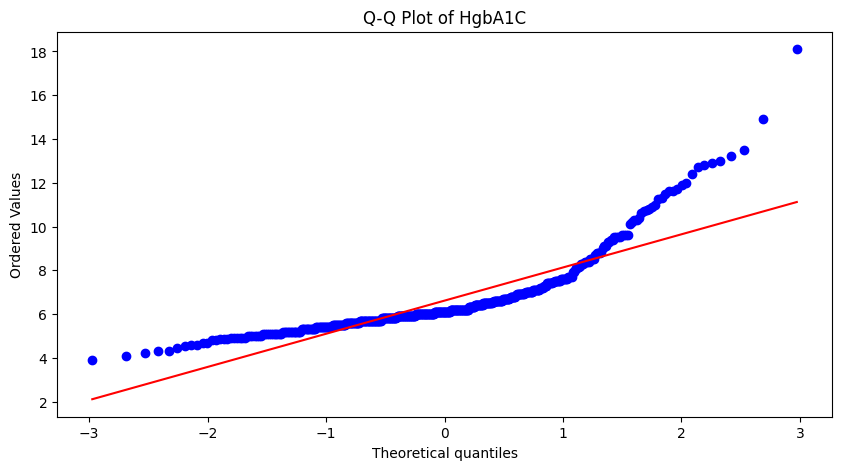

In [29]:
# Plotting a histogram
plt.figure(figsize=(10, 5))
sns.histplot(ckd_df['HgbA1C'].dropna(), kde=True)
plt.title('Histogram of HgbA1C')
plt.xlabel('HgbA1C')
plt.ylabel('Frequency')
plt.show()

# Plotting a Q-Q plot
plt.figure(figsize=(10, 5))
probplot(ckd_df['HgbA1C'].dropna(), dist="norm", plot=plt)
plt.title('Q-Q Plot of HgbA1C')
plt.show()

##### Thanks to the plots, we understand that the column isn't normally distributed, therefore we'll find another way to fill the missing values, thanks to relationships between this column and other columns.
##### Based on our research hgbA1C is related to diabetes, and can also be influenced by age and BMI.

In [30]:
# Understanding the rows with missing values
ckd_df.loc[ckd_df['HgbA1C'].isnull(), ['HgbA1C', 'HistoryDiabetes', 'BMIBaseline', 'AgeBaseline', 'Age.3.categories', 'EventCKD35']]

,HgbA1C,HistoryDiabetes,BMIBaseline,AgeBaseline,Age.3.categories,EventCKD35
StudyID,,,,,,
231,NaN,0,27.979422,48,0,0
279,NaN,0,24.761679,59,1,0
280,NaN,0,23.836735,58,1,1
326,NaN,0,18.507766,59,1,0
379,NaN,0,22.518210,50,1,0
606,NaN,0,27.744748,33,0,0
615,NaN,0,12.698962,56,1,0
658,NaN,0,35.999857,30,0,0
698,NaN,1,27.104592,60,1,0


##### We will fill missing values in column hgbA1C thanks to a linear regression with columns relevant to the hemoglobineA1C (known by research) HistoryDiabetes, BMIBaseline and AgeBaseline.

In [31]:
# Separate the rows with missing HgbA1C values
missing_hgba1c = ckd_df[ckd_df['HgbA1C'].isnull()]
complete_hgba1c = ckd_df.dropna(subset=['HgbA1C'])

# Define features and target
X = complete_hgba1c[['BMIBaseline', 'AgeBaseline', 'HistoryDiabetes']]
y = complete_hgba1c['HgbA1C']

# Train a linear regression model
linreg = LinearRegression()
linreg.fit(X, y)
# Predict the missing HgbA1C values
X_missing = missing_hgba1c[['BMIBaseline', 'AgeBaseline', 'HistoryDiabetes']]
missing_hgba1c['HgbA1C'] = linreg.predict(X_missing)

# Combine the datasets
ckd_df = pd.concat([complete_hgba1c, missing_hgba1c])
ckd_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 485 entries, 1 to 967
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Gender                 485 non-null    int64  
 1   AgeBaseline            485 non-null    int64  
 2   Age.3.categories       485 non-null    int64  
 3   HistoryDiabetes        485 non-null    int64  
 4   HistoryCHD             485 non-null    int64  
 5   HistoryVascular        485 non-null    int64  
 6   HistorySmoking         485 non-null    int64  
 7   HistoryHTN             485 non-null    int64  
 8   HistoryDLD             485 non-null    int64  
 9   HistoryObesity         485 non-null    int64  
 10  DLDmeds                485 non-null    int64  
 11  DMmeds                 485 non-null    int64  
 12  HTNmeds                485 non-null    int64  
 13  ACEIARB                485 non-null    int64  
 14  CholesterolBaseline    485 non-null    float64
 15  Triglycerid

In [32]:
ckd_df.describe()

,Gender,AgeBaseline,Age.3.categories,HistoryDiabetes,HistoryCHD,HistoryVascular,HistorySmoking,HistoryHTN,HistoryDLD,HistoryObesity,...,CholesterolBaseline,TriglyceridesBaseline,HgbA1C,CreatnineBaseline,eGFRBaseline,sBPBaseline,dBPBaseline,BMIBaseline,TimeToEventMonths,EventCKD35
count,485.000000,485.000000,485.000000,485.000000,485.000000,485.000000,485.000000,485.000000,485.000000,485.000000,...,485.000000,485.000000,485.000000,485.000000,485.000000,485.000000,485.000000,485.000000,485.000000,485.000000
mean,0.511340,53.395876,0.870103,0.443299,0.092784,0.059794,0.152577,0.686598,0.653608,0.509278,...,4.979753,1.315127,6.585378,67.910722,97.955648,131.581443,76.967010,30.248546,83.305155,0.115464
std,0.500388,13.765149,0.758991,0.497288,0.290428,0.237349,0.359951,0.464355,0.476311,0.500430,...,1.100283,0.793141,1.700970,17.868842,18.452079,15.659868,10.716238,6.204234,25.816135,0.319911
min,0.000000,23.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.230000,0.180000,3.900000,6.000000,60.049838,92.000000,41.000000,12.698962,0.000000,0.000000
25%,0.000000,44.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,4.200000,0.780000,5.629076,55.000000,86.418626,121.000000,69.000000,25.990903,78.000000,0.000000
50%,1.000000,54.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,...,5.000000,1.110000,6.100000,66.000000,98.022453,131.000000,77.000000,29.696263,93.000000,0.000000
75%,1.000000,64.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,...,5.800000,1.620000,6.900000,79.000000,109.423858,141.000000,84.000000,33.203055,100.000000,0.000000
max,1.000000,89.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,9.300000,6.240000,18.100000,123.000000,242.615536,180.000000,112.000000,56.797436,111.000000,1.000000


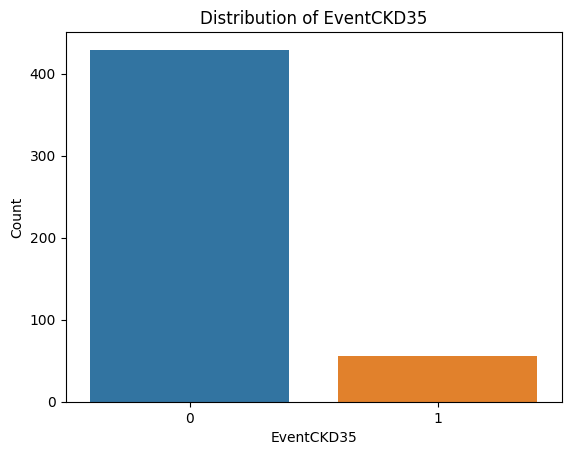

In [33]:
# Distribution of target variable
sns.countplot(x='EventCKD35', data=ckd_df)
plt.title('Distribution of EventCKD35')
plt.xlabel('EventCKD35')
plt.ylabel('Count')
plt.show()

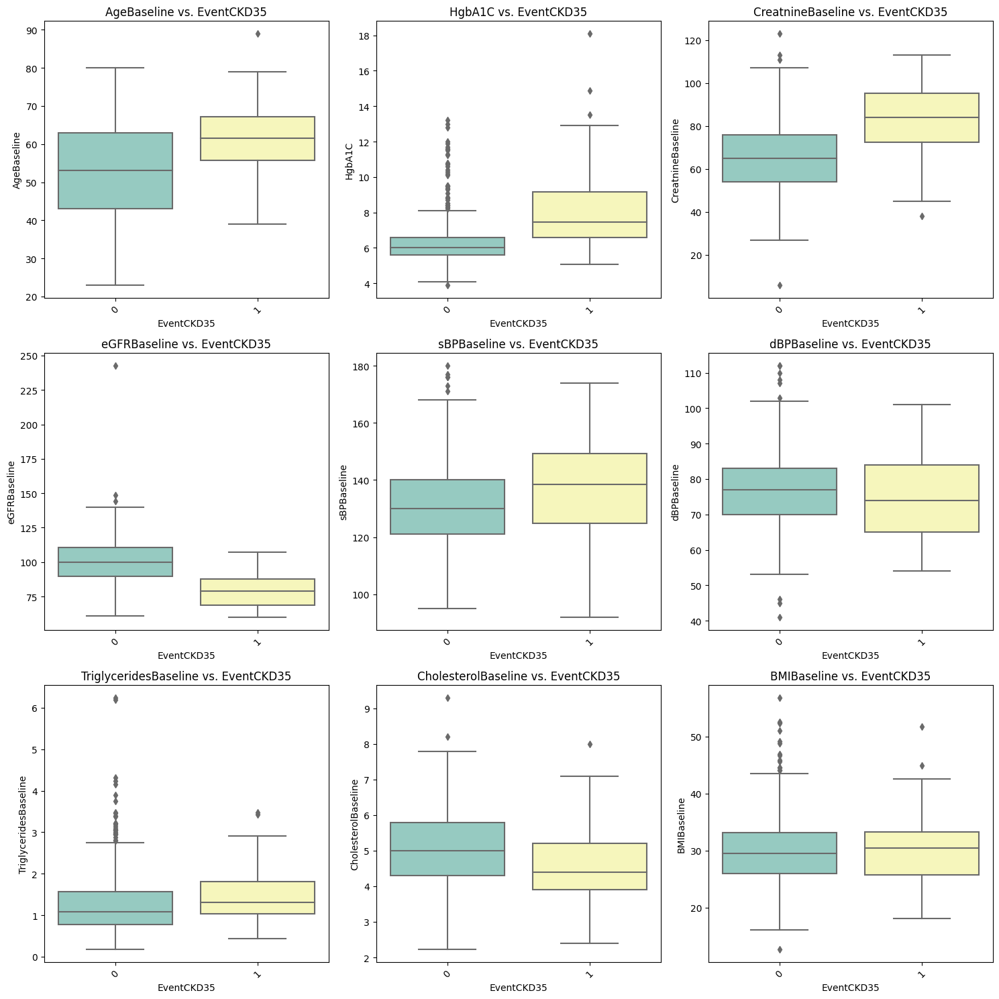

In [34]:
# Relationships between numerical features and target variable
# Selecting columns for the boxplot matrix
selected_columns = ['AgeBaseline', 'HgbA1C', 'CreatnineBaseline', 'eGFRBaseline', 
           'sBPBaseline', 'dBPBaseline', 'TriglyceridesBaseline', 
           'CholesterolBaseline', 'BMIBaseline']

# Setting up the figure and axis layout
fig, axes = plt.subplots(3, 3, figsize=(15, 15))

# Flattening the axes array for easy iteration
axes = axes.flatten()

# Creating separate boxplots for each column
for i, col in enumerate(selected_columns):
    sns.boxplot(x='EventCKD35', y=col, data=ckd_df, ax=axes[i], palette='Set3')
    axes[i].set_title(f'{col} vs. EventCKD35')
    axes[i].set_xlabel('EventCKD35')
    axes[i].set_ylabel(col)
    axes[i].tick_params(axis='x', labelrotation=45)  # Rotate x-axis labels for better visibility

# Adjusting layout
plt.tight_layout()
plt.show()

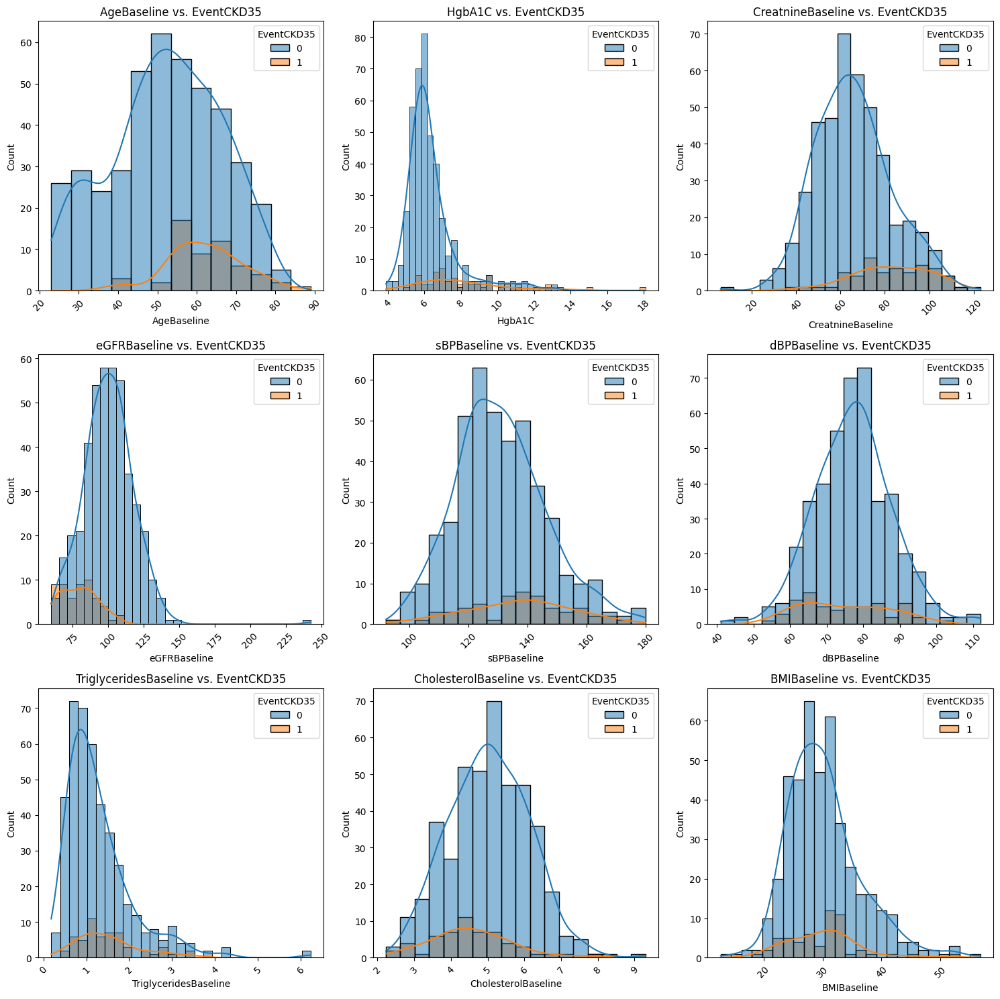

In [35]:
# Distribution of features

# Setting up the figure and axis layout
fig, axes = plt.subplots(3, 3, figsize=(15, 15))

# Flattening the axes array for easy iteration
axes = axes.flatten()

# Creating separate boxplots for each column
for i, col in enumerate(selected_columns):
    sns.histplot(data=ckd_df, x=col, hue='EventCKD35', kde=True, ax=axes[i])
    axes[i].set_title(f'{col} vs. EventCKD35')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Count')  
    axes[i].tick_params(axis='x', labelrotation=45)  # Rotate x-axis labels for better visibility

# Hide empty subplots if there are more plots than columns
for j in range(len(selected_columns), len(axes)):
    axes[j].axis('off')

# Adjusting layout
plt.tight_layout()
plt.show()

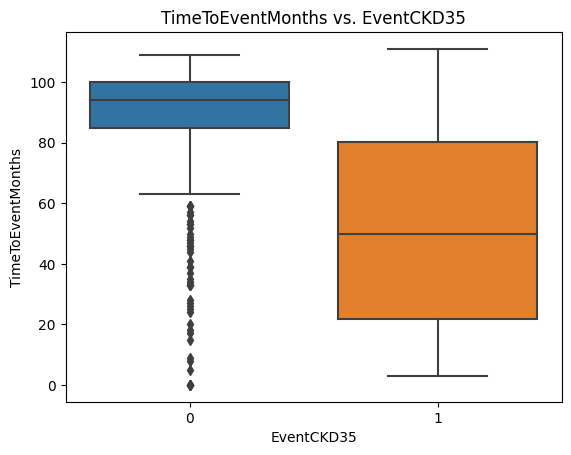

In [36]:
# Understanding the column TimeToEventMonths
sns.boxplot(x='EventCKD35', y='TimeToEventMonths', data=ckd_df)
plt.title('TimeToEventMonths vs. EventCKD35')
plt.show()

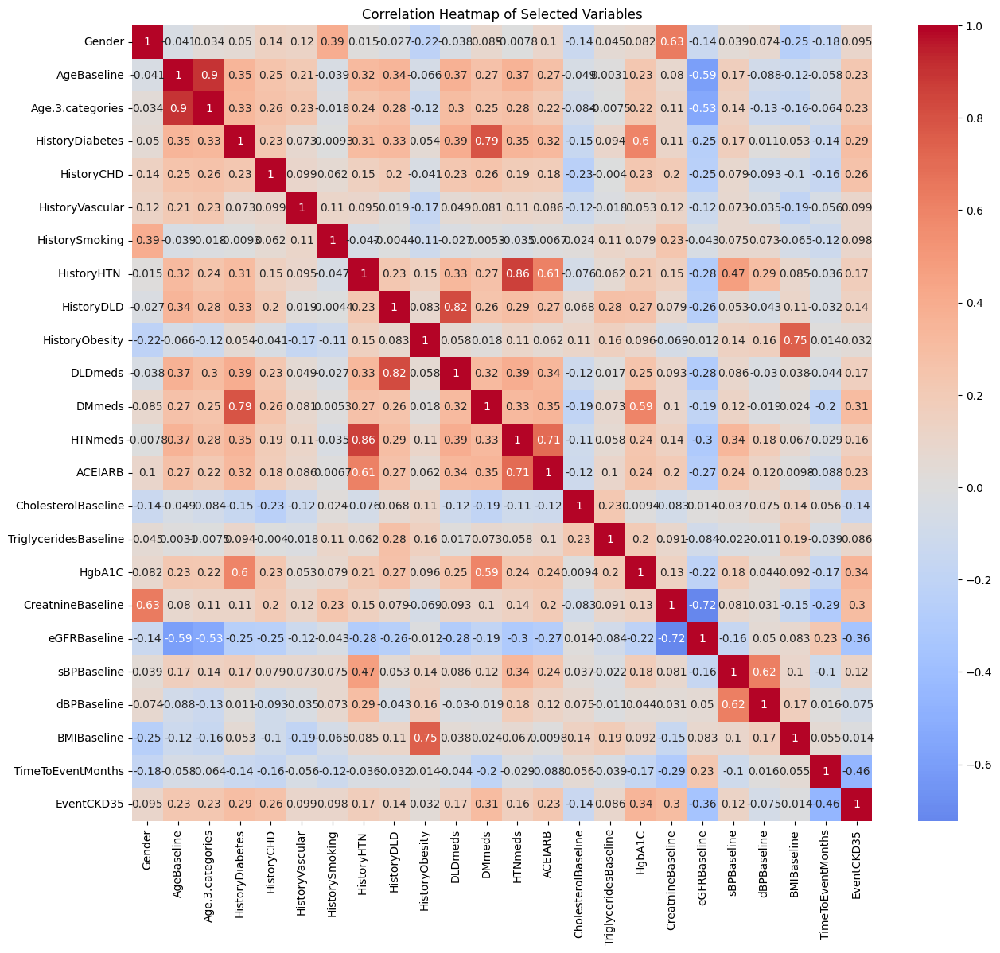

In [37]:
# Creating a correlation matrix
correlation_matrix = ckd_df.corr()

# Creating a correlation heatmap of selected variables
plt.figure(figsize=(15, 13))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title('Correlation Heatmap of Selected Variables')
plt.show()

##### Performing StandardScaler on numerical columns and OrdinalEncoder on column Age.3.categories:

In [38]:
ckd = ckd_df.copy()
# Ordinal encoding for the 'Age.3.categories' column
ordinal_encoder = OrdinalEncoder()
ckd_df['Age.3.categories'] = ordinal_encoder.fit_transform(ckd_df[['Age.3.categories']])

# Identifying numerical columns
numerical_cols = ['AgeBaseline', 'CholesterolBaseline', 'TriglyceridesBaseline', 'HgbA1C',
       'CreatnineBaseline', 'eGFRBaseline', 'sBPBaseline', 'dBPBaseline',
       'BMIBaseline', 'TimeToEventMonths']

# Standard scaling for numerical columns
scaler = StandardScaler()
ckd_df[numerical_cols] = scaler.fit_transform(ckd_df[numerical_cols])

ckd_df.head()

,Gender,AgeBaseline,Age.3.categories,HistoryDiabetes,HistoryCHD,HistoryVascular,HistorySmoking,HistoryHTN,HistoryDLD,HistoryObesity,...,CholesterolBaseline,TriglyceridesBaseline,HgbA1C,CreatnineBaseline,eGFRBaseline,sBPBaseline,dBPBaseline,BMIBaseline,TimeToEventMonths,EventCKD35
StudyID,,,,,,,,,,,,,,,,,,,,,
1,0,0.771156,1.0,0,0,0,0,1,1,1,...,-0.163538,-0.498695,-0.403349,-0.499189,-0.251537,0.793837,0.937208,1.599477,0.569799,0
2,0,-0.101511,1.0,0,0,0,0,1,1,1,...,1.292135,0.662448,-0.344499,-0.891336,0.427395,1.049530,1.310859,2.305385,0.880003,0
3,0,0.189378,1.0,0,0,0,0,1,1,1,...,1.292135,0.548858,-0.403349,-0.611231,0.102217,1.113454,0.843796,1.661046,0.182045,0
4,0,0.334822,1.0,0,0,0,0,0,1,1,...,0.109401,-0.120061,-0.638752,-0.163062,-0.414500,-0.996019,-0.837632,0.286719,0.763677,0
5,0,0.698433,1.0,1,0,0,0,1,1,1,...,0.018421,-0.258894,0.514721,0.117044,-0.989009,0.026756,-1.304696,0.082102,0.841228,0


                  Feature        VIF
0                  Gender   8.582630
1             AgeBaseline   5.227706
2        Age.3.categories   8.657533
3         HistoryDiabetes   5.609702
4              HistoryCHD   1.381956
5         HistoryVascular   1.206811
6          HistorySmoking   1.472966
7             HistoryHTN   14.657339
8              HistoryDLD  11.528849
9          HistoryObesity   4.223810
10                DLDmeds   9.664726
11                 DMmeds   4.587628
12                HTNmeds  14.275722
13                ACEIARB   3.925557
14    CholesterolBaseline   1.277244
15  TriglyceridesBaseline   1.382186
16                 HgbA1C   1.751985
17      CreatnineBaseline  13.139227
18           eGFRBaseline  13.137769
19            sBPBaseline   2.054708
20            dBPBaseline   1.860949
21            BMIBaseline   2.350864
22      TimeToEventMonths   1.165939


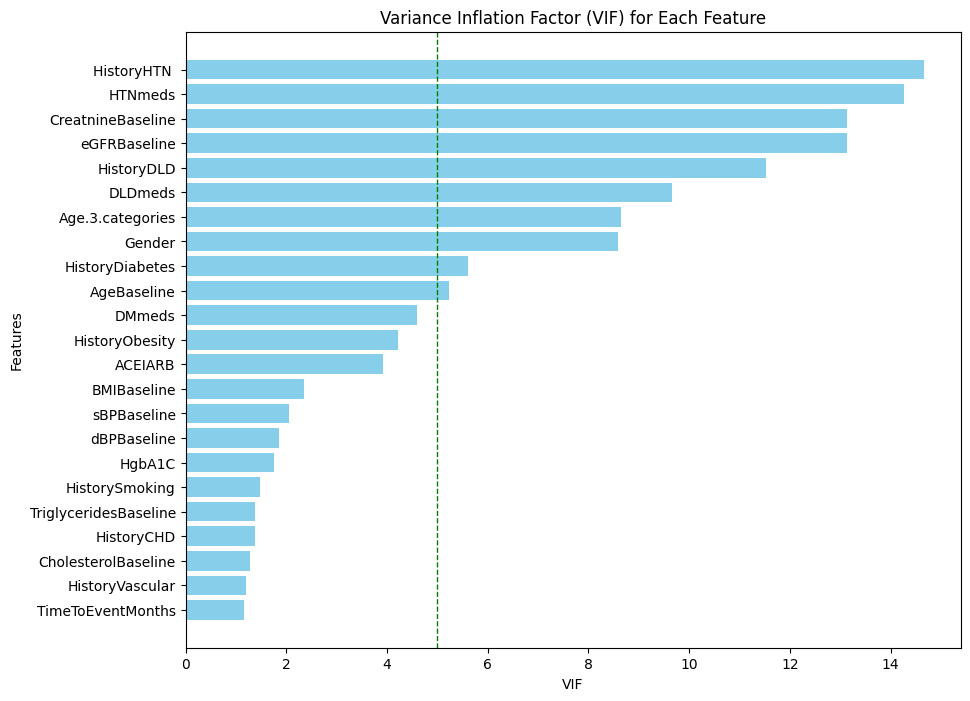

In [39]:
# Calculating VIF
X = ckd_df.drop('EventCKD35', axis=1)  # Independent variables
y = ckd_df['EventCKD35'] # Dependant variable
vif_data = pd.DataFrame()
vif_data['Feature'] = X.columns
vif_data['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Print VIF values
print(vif_data)

# Sort dataframe by VIF values for better visualization
vif_data = vif_data.sort_values(by='VIF', ascending=False)
# Plotting the VIF values with a vertical line at x=5
plt.figure(figsize=(10, 8))
plt.barh(vif_data['Feature'], vif_data['VIF'], color='skyblue')
plt.axvline(x=5, color='green', linestyle='--', linewidth=1)  # Adding the vertical line
plt.xlabel('VIF')
plt.ylabel('Features')
plt.title('Variance Inflation Factor (VIF) for Each Feature')
plt.gca().invert_yaxis()  # To display the highest VIF at the top
plt.show()

##### Generally, VIF values above 5 are considered problematic because of high multicollinearity with other variables in the dataset.
In this graph, several variables exceed this threshold:
- HistoryHTN
- HTNmeds
- CreatinineBaseline
- eGFRBaseline
- HistoryDLD
- DLDmeds
- Age.3.categories
- Gender
- HistoryDiabetes
- AgeBaseline

The high VIF values for these variables suggest strong multicollinearity, meaning they are highly correlated with other predictors and it could impact the model's building process. We will try to understand why those variables are highly correlated to other variables.

##### Relevant information on Hypertension (HTN):

Hypertension (high blood pressure) often exhibits strong multicollinearity with other variables in medical datasets because it is a central condition linked to a wide range of risk factors, comorbidities, and clinical measurements. 

In this case, HistoryHTN and HTNmeds would be correlated with:

- AgeBaseline because older individuals are more likely to have hypertension
- BMIBaseline because obesity is a risk factor for hypertension
- HgbA1C due to the link between diabetes and hypertension
- eGFRBaseline because hypertension can cause and be caused by kidney disease
- sBPBaseline and dBPBaseline are direct measurements related to hypertension

##### The same kind of explanation can be given regarding dyslipidemia (HistoryDLD and DLDmeds) since it is a medical condition characterized by abnormal levels of lipids (fats) in the blood. These lipids primarily include cholesterol and triglycerides, explaining the high correlation between DLD and other factors in the dataset.

##### Relevant information on eGFRBaseline:

eGFRBaseline refers to the estimated Glomerular Filtration Rate at baseline, a key measure of kidney function. It is a test used to assess how well kidneys are working. The "Baseline" part indicates this is the initial or starting measurement, often taken at the beginning of a study or before treatment.

eGFR is calculated using a formula that includes factors like:
- Serum Creatinine levels
- Age
- Gender

Since it is calculated thanks to those other factors, it explains the high multicollinearity found in the VIF graph between those variables and other factors.

<hr style="height:3px; border:none; color:#333; background-color:#333;">

## 2. Feature Selection

### First step: dropping columns based on correlation heatmap and VIF graph

In [40]:
ckd_origin = ckd_df.copy() # Saving dataframe for future use.

In [41]:
ckd_df.drop(['HistoryHTN ', 'HTNmeds','CreatnineBaseline', 'Age.3.categories','Gender','DLDmeds', 'DMmeds'], axis=1, inplace=True)

### Second step: Evaluating feature importance thanks to mutual information scores

##### Mutual information scores highlight non-linear relationships between features and the target variable.

                  Feature  MI Score
15      TimeToEventMonths  0.097024
11           eGFRBaseline  0.079653
0             AgeBaseline  0.060147
10                 HgbA1C  0.053966
1         HistoryDiabetes  0.041566
7                 ACEIARB  0.039250
4          HistorySmoking  0.028220
2              HistoryCHD  0.024818
6          HistoryObesity  0.022538
5              HistoryDLD  0.017016
3         HistoryVascular  0.015245
13            dBPBaseline  0.010073
8     CholesterolBaseline  0.000000
9   TriglyceridesBaseline  0.000000
12            sBPBaseline  0.000000
14            BMIBaseline  0.000000


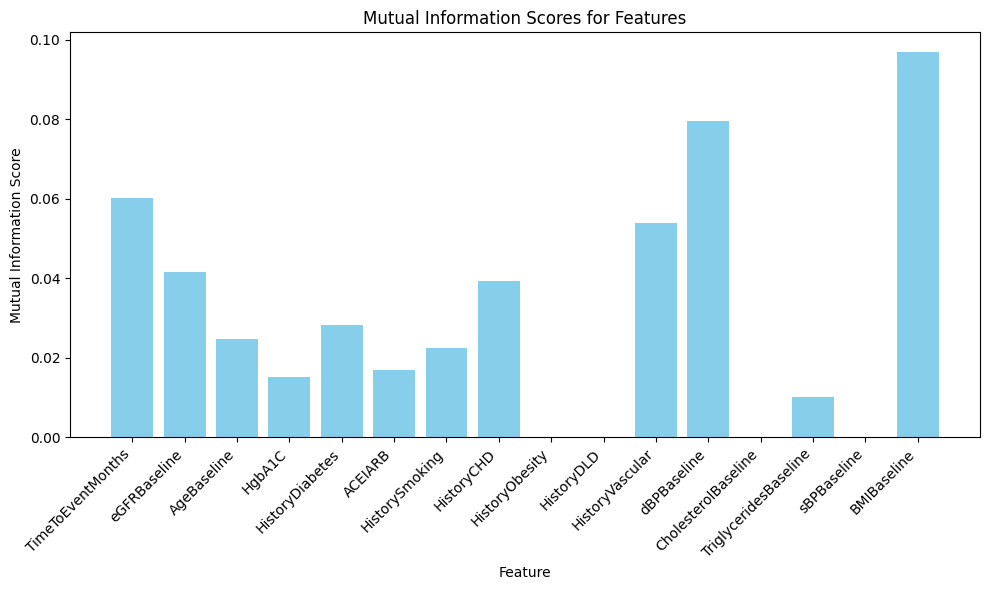

In [42]:
# Calculate mutual information scores
X = ckd_df.drop(columns='EventCKD35')
y = ckd_df['EventCKD35']
mi_scores = mutual_info_classif(X, y, random_state=0)

mi_data = pd.DataFrame()
mi_data['Feature'] = X.columns
mi_data['MI Score'] = mi_scores

mi_data.sort_values(by='MI Score', ascending=False, inplace=True)
print(mi_data)

# Plotting the mutual information scores
plt.figure(figsize=(10, 6))
plt.bar(mi_data['Feature'], mi_scores, color='skyblue')
plt.xlabel('Feature')
plt.ylabel('Mutual Information Score')
plt.title('Mutual Information Scores for Features')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

##### Removing columns that have a mutual info score equal to 0 since they don't influence in any way the prediction of our target variable EventCKD35.

In [43]:
ckd_df.drop(['BMIBaseline', 'TriglyceridesBaseline', 'CholesterolBaseline', 'sBPBaseline'], axis=1, inplace=True)

### Third Step: Performing Recursive Feature Elimination (RFE) with RandomForestClassifier for feature selection (wrapper technique):

### Performing same code that the one above but with the best parameters that came out (because of run time)


In [86]:
X = ckd_df.drop(columns='EventCKD35')
y = ckd_df['EventCKD35']
# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Assuming RandomForestClassifier for classification task
rf = RandomForestClassifier(n_estimators=200, max_depth=None, min_samples_split=5, random_state=42)

# Create RFE object and fit it with Random Forest
rfe = RFE(estimator=rf, n_features_to_select=8)  
rfe.fit(X_train, y_train)

# Print selected features
selected_features_rfe = X.columns[rfe.support_]
print("Selected features by RFE with Random Forest:")
print(selected_features_rfe)

Selected features by RFE with Random Forest:
Index(['AgeBaseline', 'HistoryDiabetes', 'ACEIARB', 'HgbA1C', 'eGFRBaseline',
       'dBPBaseline', 'TimeToEventMonths'],
      dtype='object')


##### Removing columns that were not selected by RFE.

In [46]:
ckd_df.drop(['HistoryCHD','HistorySmoking', 'HistoryDLD','HistoryObesity'], axis=1, inplace=True)

### 4th Step: Performing ElasticNet for feature selection (statistical technique):

In [47]:
X = ckd_df.drop(columns='EventCKD35')
y = ckd_df['EventCKD35']
# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the parameter grid
param_grid = {'alpha': [0.01, 0.1, 0.5, 1.0], 'l1_ratio': [0.1, 0.5, 0.9]  }

# Create ElasticNet model
elastic_net = ElasticNet()

# Setup GridSearchCV
grid_search = GridSearchCV(estimator=elastic_net, param_grid=param_grid, cv=5)

# Fit GridSearchCV
grid_search.fit(X_train, y_train)

# Print the best parameters found
print("Best parameters for ElasticNet:", grid_search.best_params_)

# Initialize ElasticNet with best parameters
best_elastic_net = grid_search.best_estimator_

# Fit ElasticNet with best parameters on the training data
best_elastic_net.fit(X_train, y_train)

# Print selected features and their coefficients
selected_features_elastic_net = X.columns[best_elastic_net.coef_ != 0]
print("\nSelected features by ElasticNet:")
print(selected_features_elastic_net)


Best parameters for ElasticNet: {'alpha': 0.1, 'l1_ratio': 0.1}

Selected features by ElasticNet:
Index(['AgeBaseline', 'HistoryDiabetes', 'ACEIARB', 'HgbA1C', 'eGFRBaseline',
       'dBPBaseline', 'TimeToEventMonths'],
      dtype='object')


##### Removing columns with 0 coefficient in ElasticNet.

In [48]:
ckd_df.drop(['HistoryVascular'], axis=1, inplace=True)

### **Feature Selection Techniques:**
We first used correlation heatmap and VIF to eliminate multicollinearity and redundancy in our dataset. After that, thanks to mutual info scores we were able to remove features that didn't influence our target variable in any way.
Then we used famous techniques for feature selection, one statistical and one wrapper technique. For both techniques, we used cross-validation to find the optimal parameters.

##### RFE with Random Forest Classifier

- Recursive Feature Elimination (RFE) is a wrapper technique for feature selection that selects feature subsets by iteratively training a Random Forest model and removing the least important features until a desired number remains.
- It can capture nonlinear relationships and interactions between features, making it robust against outliers and noisy data. It is great for classification problems with complex feature interactions.
- However, it can be computationally intensive for large datasets and sensitive to the choice of the number of features to select.

##### ElasticNet

- ElasticNet is a statistical technique for feature selection that combines Lasso (L1 regularization) and Ridge (L2 regularization) to select features by penalizing coefficients, encouraging a sparse feature space.
- It's suitable for datasets with many features and multicollinearity issues and versatile for various regression tasks. ElasticNet automatically selects relevant features while controlling overfitting.
- One of the drawbacks of ElasticNet is it requires tuning of regularization parameters (alpha and l1_ratio). Depending on parameter settings, it may discard correlated variables.

##### **Validation and Comparison**:
The method employed proved to be the most conclusive; however, we iteratively experimented with different feature combinations to find the most effective one.
Employing multiple techniques for feature selection allowed us to validate and compare the selected feature subset. This helps understand which features consistently contribute to model performances.

Here are the selected features:
- **Selected features by RFE with Random Forest (8 features):**
  - 'AgeBaseline', 'HistoryDiabetes', 'HistoryVascular', 'ACEIARB',  'HgbA1C', 'eGFRBaseline', 'dBPBaseline', 'TimeToEventMonths'
- **Selected features by ElasticNet 7 features):**
  - 'AgeBaseline', 'HistoryDiabetes', 'ACEIARB', 'HgbA1C', 'eGFRBaseline',  'dBPBaseline', 'TimeToEventMonths'

These subsets represent the features that each method suggests are the most important for predicting the target variable 'EventCKD35'. The overlap in selected features, such as 'HgbA1C', 'eGFRBaseline', and 'TimeToEventMonths', suggests their strong predictive value across both techniques
. 
##### **We chose to remove features based on the results from the different techniques employed after each step to find the best subset of features to predict our target variable.**

### Selected features analysis

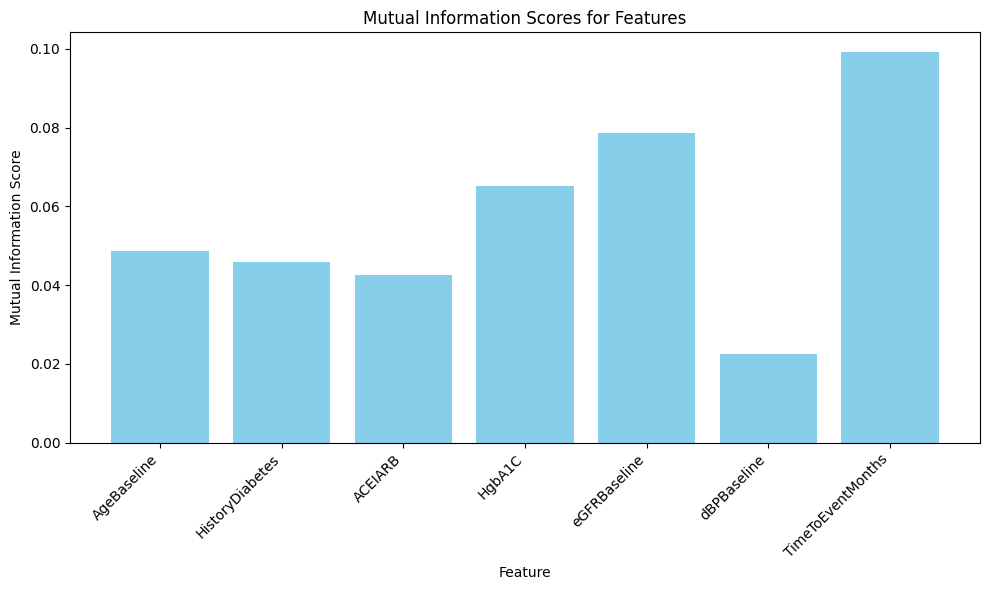

In [49]:
ckd_df1 = ckd_df.copy()
X1 = ckd_df1.drop(columns=['EventCKD35'])
y1 = ckd_df1['EventCKD35']

# Compute mutual information scores
mi_scores = mutual_info_classif(X1, y1)

# Get feature names from the DataFrame columns
feature_names = X1.columns

# Plotting the mutual information scores
plt.figure(figsize=(10, 6))
plt.bar(feature_names, mi_scores, color='skyblue')
plt.xlabel('Feature')
plt.ylabel('Mutual Information Score')
plt.title('Mutual Information Scores for Features')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

             Feature       VIF
0        AgeBaseline  1.635056
1    HistoryDiabetes  2.071310
2            ACEIARB  1.739519
3             HgbA1C  1.342898
4       eGFRBaseline  1.659968
5        dBPBaseline  1.029568
6  TimeToEventMonths  1.087540


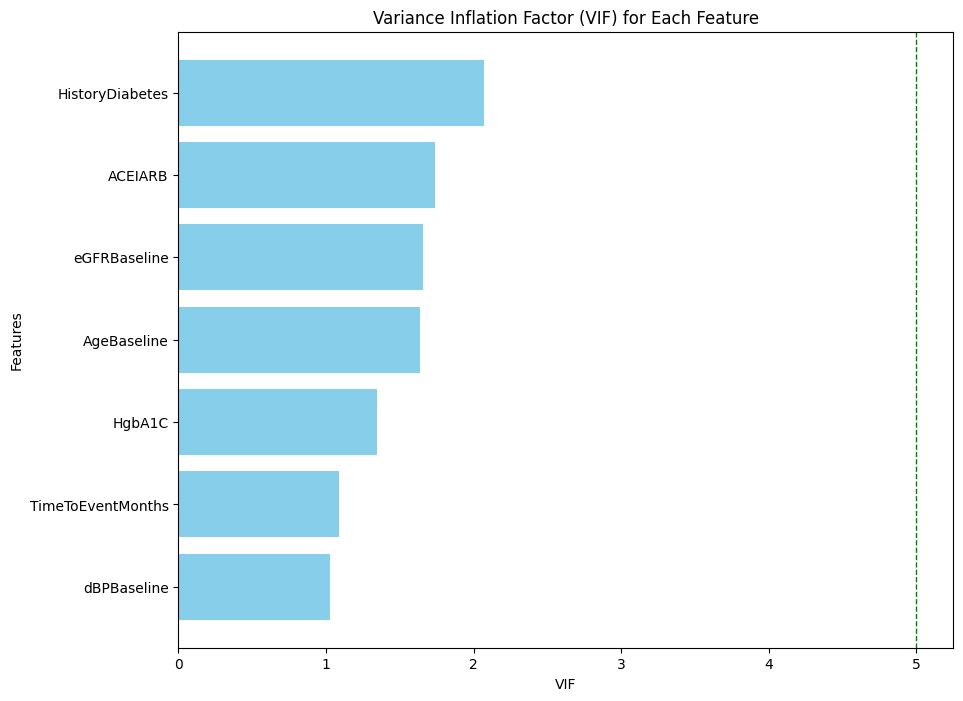

In [50]:
# Calculating VIF

vif_data1 = pd.DataFrame()
vif_data1['Feature'] = X1.columns
vif_data1['VIF'] = [variance_inflation_factor(X1.values, i) for i in range(X1.shape[1])]

# Print VIF values
print(vif_data1)

# Sort dataframe by VIF values for better visualization
vif_data1 = vif_data1.sort_values(by='VIF', ascending=False)
# Plotting the VIF values with a vertical line at x=5
plt.figure(figsize=(10, 8))
plt.barh(vif_data1['Feature'], vif_data1['VIF'], color='skyblue')
plt.axvline(x=5, color='green', linestyle='--', linewidth=1)  
plt.xlabel('VIF')
plt.ylabel('Features')
plt.title('Variance Inflation Factor (VIF) for Each Feature')
plt.gca().invert_yaxis()  # To display the highest VIF at the top
plt.show()

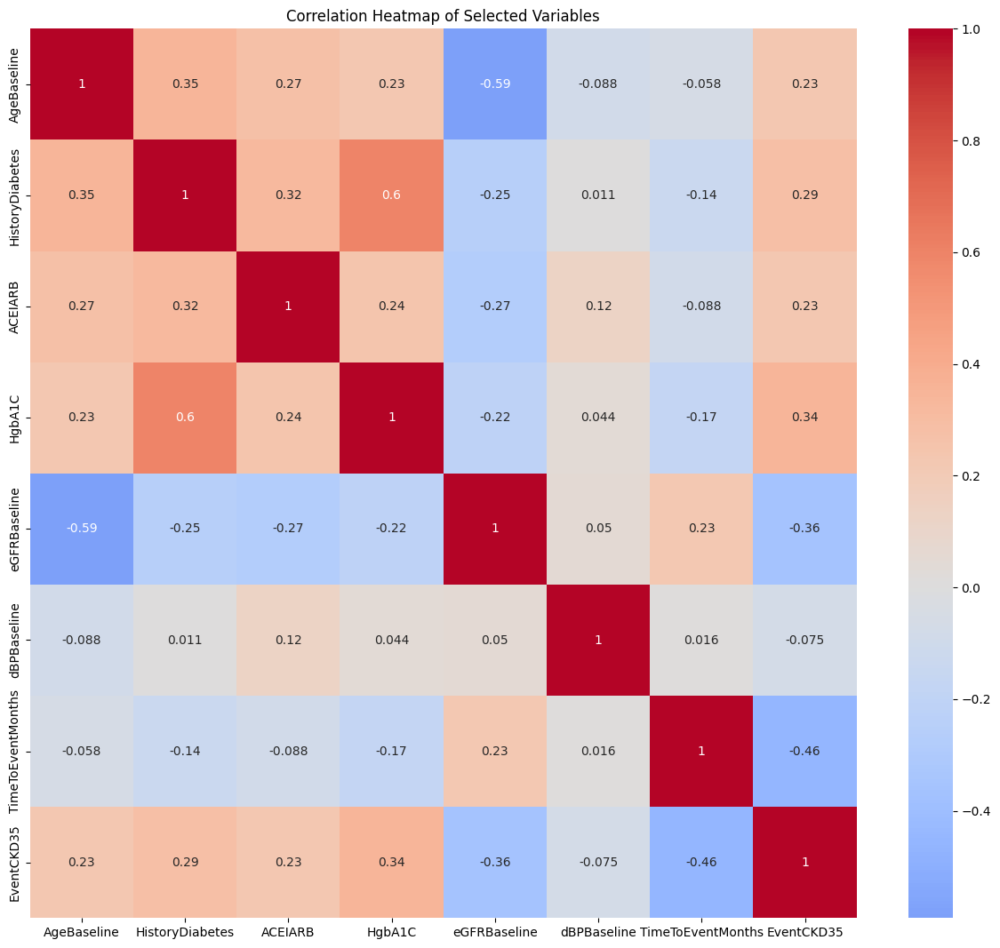

In [51]:
# Creating a correlation matrix
correlation_matrix = ckd_df1.corr()

# Creating a correlation heatmap of selected variables
plt.figure(figsize=(15, 13))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title('Correlation Heatmap of Selected Variables')
plt.show()

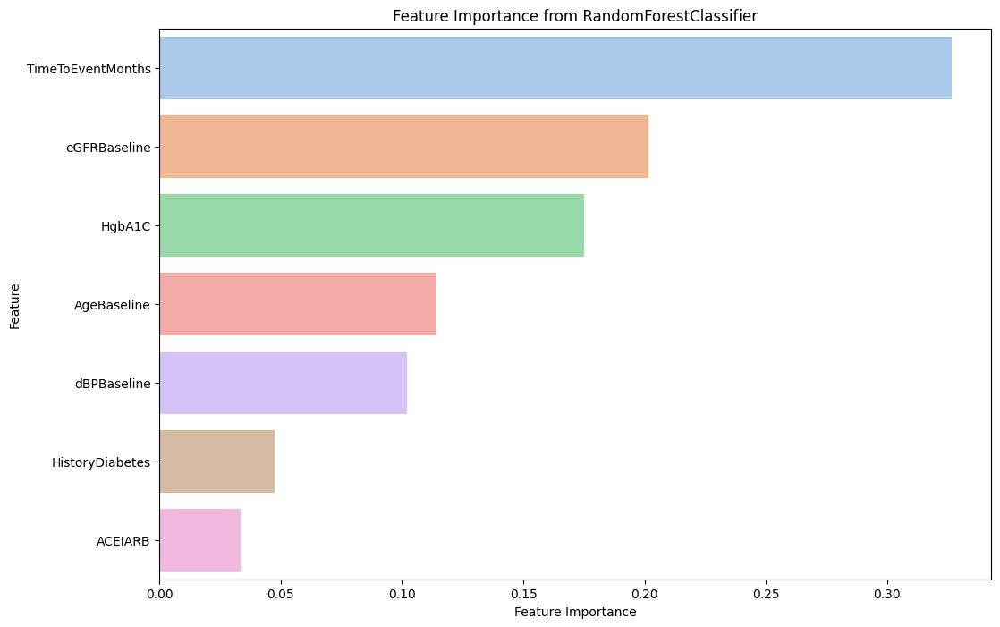

In [52]:
# Split data into train and test sets
X_train1, X_test1, y_train1, y_test1 = train_test_split(X1, y1, test_size=0.2, random_state=42)

# Initialize RandomForestClassifier for feature importance 
rf = RandomForestClassifier(random_state=42)

# Fit the model
rf.fit(X_train1, y_train1)

# Get feature importances
feature_importances = rf.feature_importances_

# Create a DataFrame for visualization
feature_importance_df = pd.DataFrame({
    'Feature': X1.columns,
    'Importance': feature_importances
})

# Sort by importance
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df, palette='pastel')
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('Feature Importance from RandomForestClassifier')
plt.show()

<hr style="height:3px; border:none; color:#333; background-color:#333;">

## 3. Class Imbalance

### Target Variable Distribution

EventCKD35
0    429
1     56
Name: count, dtype: int64


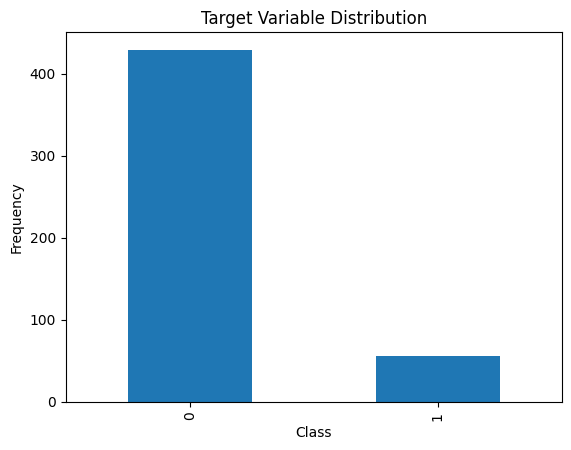

In [53]:
# Analyze the target variable distribution
ckd_counts = ckd_df1['EventCKD35'].value_counts()
print(ckd_counts)

# Plot the target variable distribution
ckd_counts.plot(kind='bar', title='Target Variable Distribution')
plt.xlabel('Class')
plt.ylabel('Frequency')
plt.show()

### Splitting data

##### To avoid overfitting due to class imbalance, we will split the data into training and test data samples before taking care of class imbalance on the training data. This will ensure that there is no overlap between the training and test data samples.
##### Furthermore, to avoid having a test set with only one class, especially the majority class, we will use stratified splitting.

In [54]:
X = ckd_df1.drop(columns=['EventCKD35'])
y = ckd_df1['EventCKD35']

# Perform stratified train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

# Check the distribution of the classes
print("Train set class distribution:")
print(y_train.value_counts(normalize=True))
print("\nTest set class distribution:")
print(y_test.value_counts(normalize=True))

Train set class distribution:
EventCKD35
0    0.884021
1    0.115979
Name: proportion, dtype: float64

Test set class distribution:
EventCKD35
0    0.886598
1    0.113402
Name: proportion, dtype: float64


### Taking care of Class Imbalance 

#### Technique 1: SMOTE

EventCKD35
0    343
1    343
Name: count, dtype: int64


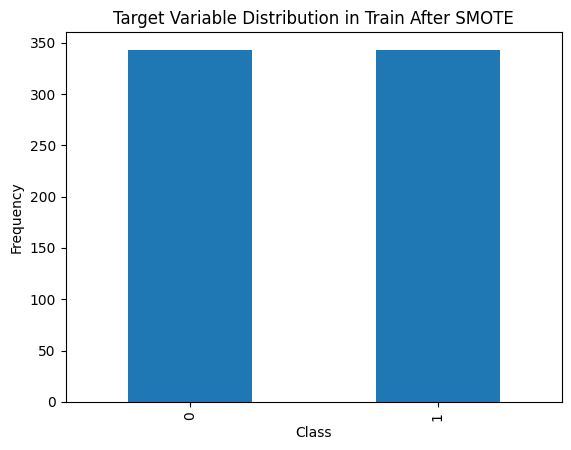

In [55]:
# Apply SMOTE
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Analyze the new target variable distribution after SMOTE
ckd_counts_smote = pd.Series(y_train_smote).value_counts()
print(ckd_counts_smote)

# Plot the new target variable distribution
ckd_counts_smote.plot(kind='bar', title='Target Variable Distribution in Train After SMOTE')
plt.xlabel('Class')
plt.ylabel('Frequency')
plt.show()

In [56]:
# Convert the resampled data to DataFrame
X_train_smote_df = pd.DataFrame(X_train_smote, columns=X.columns)
y_train_smote_df = pd.DataFrame(y_train_smote, columns=['EventCKD35'])

# Combine the features and target into a single DataFrame
smote_df = pd.concat([X_train_smote_df, y_train_smote_df], axis=1)

smote_df.head()

,AgeBaseline,HistoryDiabetes,ACEIARB,HgbA1C,eGFRBaseline,dBPBaseline,TimeToEventMonths,EventCKD35
0,-0.174234,0,0,-0.226797,-0.000374,-0.277156,-0.748566,0
1,-1.555956,0,0,-0.697603,1.595470,-1.865172,0.608575,0
2,-0.537845,1,1,-0.226797,0.557998,1.310859,-0.632240,0
3,1.062045,0,0,-0.638752,-0.081672,0.283320,0.957554,0
4,-1.919567,0,0,-0.611845,1.997624,-1.117871,-3.230196,0


##### SMOTE (Synthetic Minority Over-sampling Technique)
- SMOTE generates synthetic examples for the minority class by interpolating between existing minority class examples. This helps in creating a balanced dataset without losing any original data from the majority class.
- SMOTE is effective in preserving the information of the minority class and can lead to better generalization for the model. It is especially useful when we have a small minority class that could be overwhelmed by the majority class during training.

In [57]:
# Shuffling the dataframe 
smote_df = smote_df.sample(frac=1, random_state=42).reset_index(drop=True)

#### Technique 2: Random Undersampling

EventCKD35
0    45
1    45
Name: count, dtype: int64


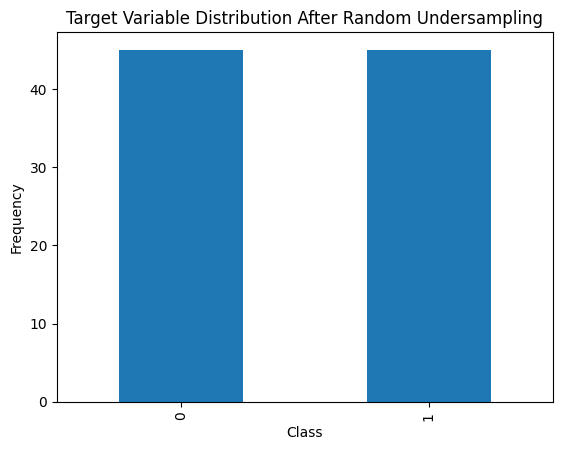

In [58]:
# Apply Random Undersampling
under = RandomUnderSampler(random_state=42)
X_train_under, y_train_under = under.fit_resample(X_train, y_train)

# Analyze the new target variable distribution after Random Undersampling
ckd_counts_under = pd.Series(y_train_under).value_counts()
print(ckd_counts_under)

# Plot the new target variable distribution
ckd_counts_under.plot(kind='bar', title='Target Variable Distribution After Random Undersampling')
plt.xlabel('Class')
plt.ylabel('Frequency')
plt.show()

In [59]:
# Convert the resampled data to DataFrame
X_train_under_df = pd.DataFrame(X_train_under, columns=X.columns)
y_train_under_df = pd.DataFrame(y_train_under, columns=['EventCKD35'])

# Combine the features and target into a single DataFrame
under_df = pd.concat([X_train_under_df, y_train_under_df], axis=1)

under_df.head()

,AgeBaseline,HistoryDiabetes,ACEIARB,HgbA1C,eGFRBaseline,dBPBaseline,TimeToEventMonths,EventCKD35
StudyID,,,,,,,,
806,-1.555956,0,0,-0.226797,0.981205,-0.090331,0.880003,0
495,-1.628678,0,0,-1.050707,-0.700659,-0.931045,-0.322036,0
638,-1.410512,0,0,-0.344499,1.233199,-0.277156,0.531024,0
406,0.480267,0,0,-0.991856,0.297204,0.003082,0.569799,0
418,1.062045,1,1,1.244470,-0.445500,-0.744220,0.841228,0


##### Random Undersampling
- Random undersampling involves reducing the number of examples in the majority class to balance the dataset. This can help in balancing the classes quickly.
- Random undersampling is straightforward and can be very effective, particularly when the majority class is significantly larger. However, it risks discarding potentially useful information.

In [60]:
# Shuffling the dataframe 
under_df = under_df.sample(frac=1, random_state=42).reset_index(drop=True)

<hr style="height:3px; border:none; color:#333; background-color:#333;">

## 4. Model Training and Evaluation

- For each option: SMOTE, Undersampling, and the regular dataset without taking care of class imbalance, we will try 4 different classification models: Logistic Regression, RandomForestClassifier, GradientBoostingClassifier, and Support Vector Machine.
- To find the best hyperparameters for each model, we will first use KFold to partition the data to assess the performance of the models on different subsets of the data, ensuring a more reliable estimate of model performance. Then we will use the cross-validation technique GridSearch to try different parameter's combination.
- We will also evaluate each model to find the one that gives us the best results.

In [61]:
# Hyperparameter grids
param_grid_lr = {
    'penalty': ['l1', 'l2'],
    'C': [0.001, 0.01, 0.1, 1, 10],
    'solver': ['liblinear', 'saga']
}

param_grid_rf = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

param_grid_gb = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5]
}

param_grid_svc = {
    'C': [0.01, 1, 10, 100],
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
    'gamma': ['scale', 'auto']
}

# Initialize models with GridSearchCV
models_with_params = {
    'Logistic Regression': (LogisticRegression(max_iter=10000), param_grid_lr),
    'Random Forest': (RandomForestClassifier(), param_grid_rf),
    'Gradient Boosting': (GradientBoostingClassifier(), param_grid_gb),
    'Support Vector Machine': (SVC(probability=True), param_grid_svc)
}

# Perform Grid Search
def perform_grid_search(models_with_params, X_train, y_train):
    best_estimators = {}
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    for name, (model, param_grid) in models_with_params.items():
        grid_search = GridSearchCV(model, param_grid, cv=kf, scoring='roc_auc', n_jobs=-1)
        grid_search.fit(X_train, y_train)
        print(f"Best parameters for {name}: {grid_search.best_params_}")
        best_estimators[name] = grid_search.best_estimator_
    return best_estimators

# Perform Grid Search for SMOTE, undersampling, and regular datasets
print("Performing Grid Search on SMOTE dataset:")
best_estimators_smote = perform_grid_search(models_with_params, X_train_smote, y_train_smote)

print("\nPerforming Grid Search on Undersampling dataset:")
best_estimators_under = perform_grid_search(models_with_params, X_train_under, y_train_under)

print("\nPerforming Grid Search on Regular dataset:")
best_estimators_regular = perform_grid_search(models_with_params, X_train, y_train)

Performing Grid Search on SMOTE dataset:
Best parameters for Logistic Regression: {'C': 0.01, 'penalty': 'l2', 'solver': 'saga'}
Best parameters for Random Forest: {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Best parameters for Gradient Boosting: {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 300}
Best parameters for Support Vector Machine: {'C': 100, 'gamma': 'auto', 'kernel': 'rbf'}

Performing Grid Search on Undersampling dataset:
Best parameters for Logistic Regression: {'C': 0.001, 'penalty': 'l2', 'solver': 'liblinear'}
Best parameters for Random Forest: {'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 100}
Best parameters for Gradient Boosting: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200}
Best parameters for Support Vector Machine: {'C': 0.01, 'gamma': 'auto', 'kernel': 'rbf'}

Performing Grid Search on Regular dataset:
Best parameters for Logistic Regression: {'C': 0.1, 'penalty': 


Final Evaluation on SMOTE Test Set:

Logistic Regression on Test Set:
AUC-ROC: 0.88, F1 Score: 0.50, Recall: 0.82, Precision: 0.36


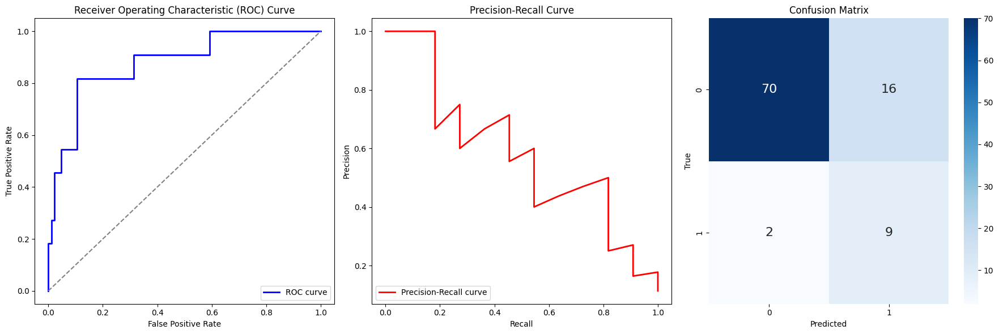


Random Forest on Test Set:
AUC-ROC: 0.90, F1 Score: 0.62, Recall: 0.82, Precision: 0.50


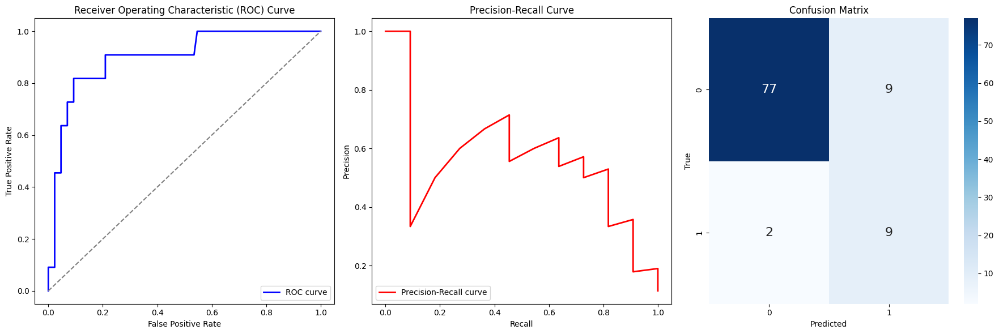


Gradient Boosting on Test Set:
AUC-ROC: 0.90, F1 Score: 0.42, Recall: 0.45, Precision: 0.38


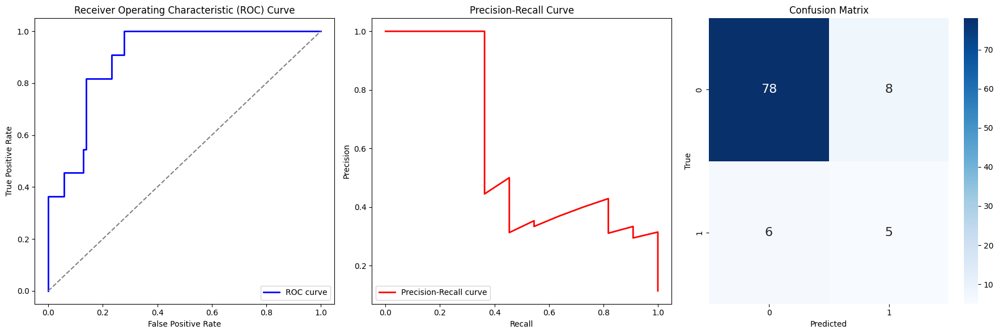


Support Vector Machine on Test Set:
AUC-ROC: 0.80, F1 Score: 0.34, Recall: 0.45, Precision: 0.28


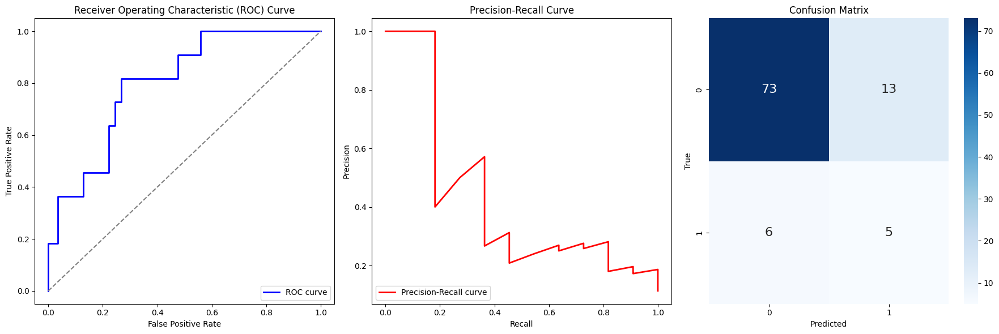


Final Evaluation on Undersampling Test Set:

Logistic Regression on Test Set:
AUC-ROC: 0.87, F1 Score: 0.30, Recall: 0.91, Precision: 0.18


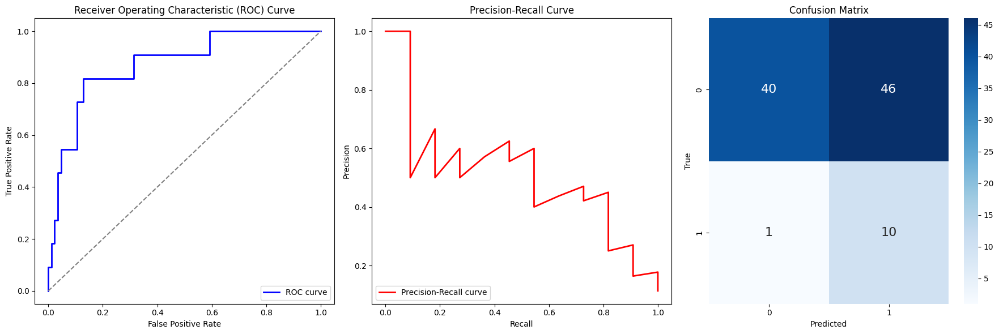


Random Forest on Test Set:
AUC-ROC: 0.84, F1 Score: 0.44, Recall: 0.73, Precision: 0.32


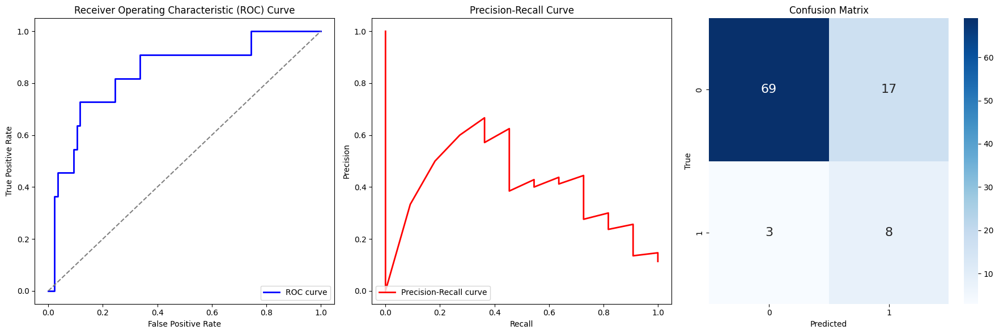


Gradient Boosting on Test Set:
AUC-ROC: 0.84, F1 Score: 0.39, Recall: 0.73, Precision: 0.27


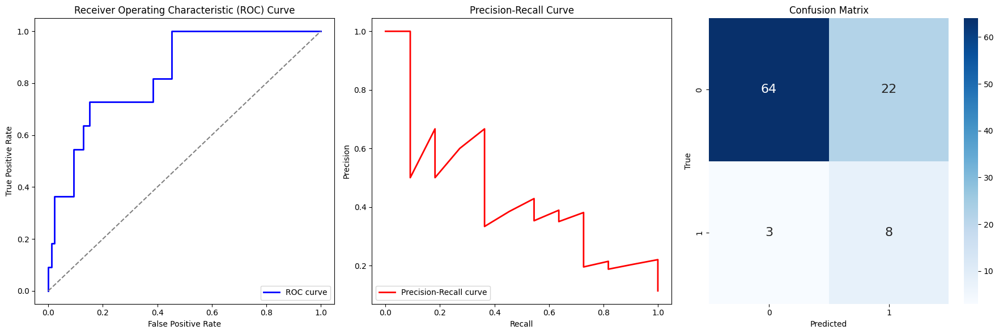


Support Vector Machine on Test Set:
AUC-ROC: 0.16, F1 Score: 0.44, Recall: 0.82, Precision: 0.30


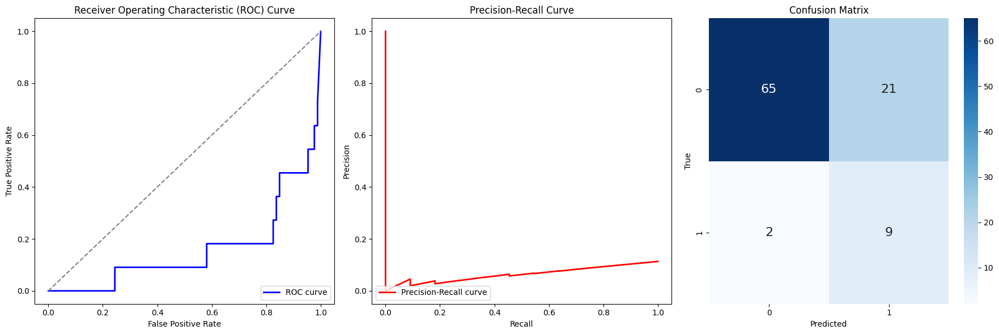


Final Evaluation on Regular Test Set:

Logistic Regression on Test Set:
AUC-ROC: 0.89, F1 Score: 0.47, Recall: 0.36, Precision: 0.67


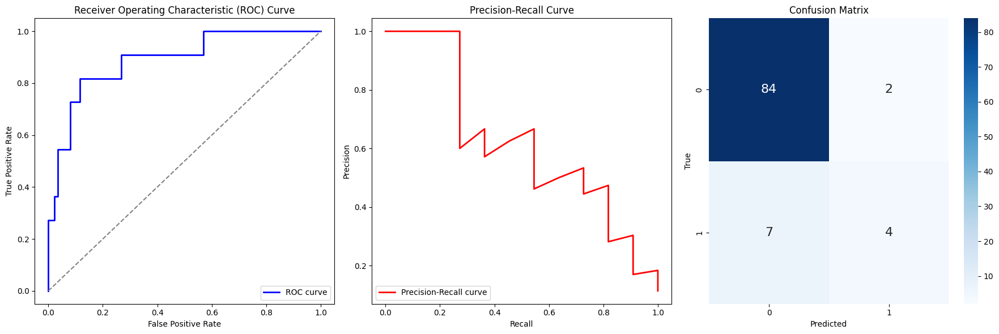


Random Forest on Test Set:
AUC-ROC: 0.89, F1 Score: 0.53, Recall: 0.45, Precision: 0.62


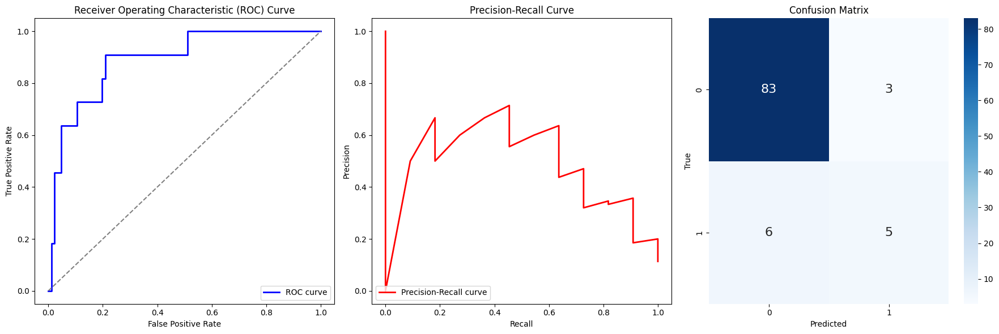


Gradient Boosting on Test Set:
AUC-ROC: 0.85, F1 Score: 0.50, Recall: 0.45, Precision: 0.56


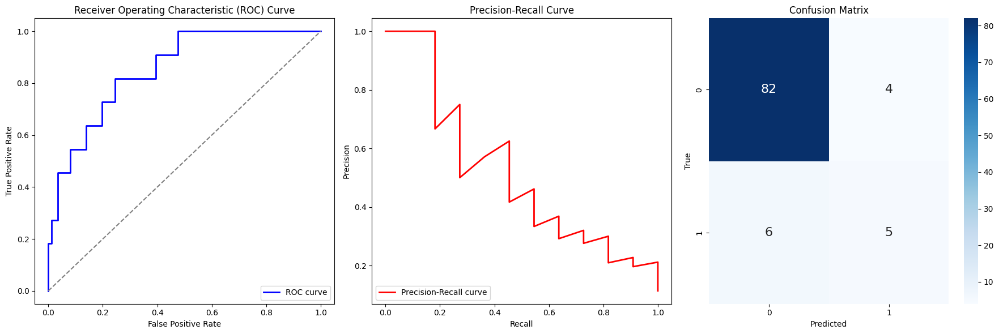


Support Vector Machine on Test Set:
AUC-ROC: 0.88, F1 Score: 0.00, Recall: 0.00, Precision: 0.00


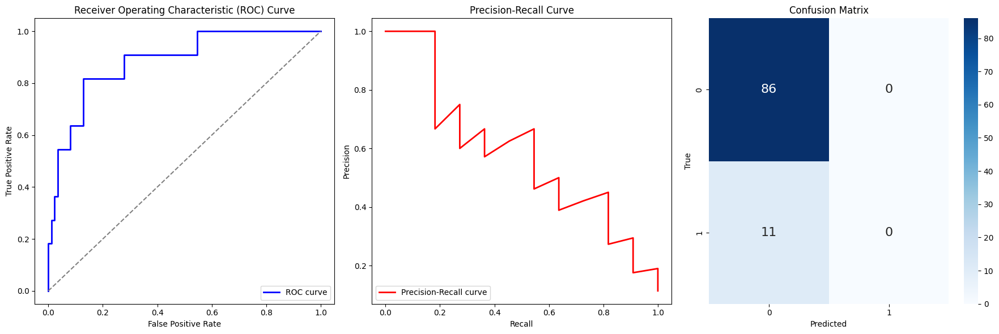


Overall Evaluation Results for SMOTE Dataset:

Model: Logistic Regression
  AUC-ROC: 0.88
  F1 Score: 0.50
  Recall: 0.82
  Precision: 0.36

Model: Random Forest
  AUC-ROC: 0.90
  F1 Score: 0.62
  Recall: 0.82
  Precision: 0.50

Model: Gradient Boosting
  AUC-ROC: 0.90
  F1 Score: 0.42
  Recall: 0.45
  Precision: 0.38

Model: Support Vector Machine
  AUC-ROC: 0.80
  F1 Score: 0.34
  Recall: 0.45
  Precision: 0.28

Overall Evaluation Results for Undersampling Dataset:

Model: Logistic Regression
  AUC-ROC: 0.87
  F1 Score: 0.30
  Recall: 0.91
  Precision: 0.18

Model: Random Forest
  AUC-ROC: 0.84
  F1 Score: 0.44
  Recall: 0.73
  Precision: 0.32

Model: Gradient Boosting
  AUC-ROC: 0.84
  F1 Score: 0.39
  Recall: 0.73
  Precision: 0.27

Model: Support Vector Machine
  AUC-ROC: 0.16
  F1 Score: 0.44
  Recall: 0.82
  Precision: 0.30

Overall Evaluation Results for Regular Dataset:

Model: Logistic Regression
  AUC-ROC: 0.89
  F1 Score: 0.47
  Recall: 0.36
  Precision: 0.67

Model: Rando

In [82]:
# Set a seed for reproducibility
np.random.seed(42)

# Function to evaluate a single model and plot evaluation metrics
def evaluate_model(model, X_train, X_test, y_train, y_test):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    y_prob = model.predict_proba(X_test)[:, 1]

    auc_roc = roc_auc_score(y_test, y_prob)
    f1 = f1_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)

    print(f"AUC-ROC: {auc_roc:.2f}, F1 Score: {f1:.2f}, Recall: {recall:.2f}, Precision: {precision:.2f}")

    # Plot ROC Curve
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    plt.figure(figsize=(18, 6))

    plt.subplot(1, 3, 1)
    plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc="lower right")

    # Plot Precision-Recall Curve
    precision_vals, recall_vals, _ = precision_recall_curve(y_test, y_prob)
    plt.subplot(1, 3, 2)
    plt.plot(recall_vals, precision_vals, color='red', lw=2, label='Precision-Recall curve')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.legend(loc="lower left")

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.subplot(1, 3, 3)
    sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', annot_kws={"size": 16})
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')

    plt.tight_layout()
    plt.show()

    return auc_roc, f1, recall, precision

# Evaluate models on the test set
def final_evaluation(best_estimators, X_train, X_test, y_train, y_test):
    final_metrics = {}
    for name, model in best_estimators.items():
        print(f"\n{name} on Test Set:")
        test_auc_roc, test_f1, test_recall, test_precision = evaluate_model(model, X_train, X_test, y_train, y_test)
        final_metrics[name] = {'AUC-ROC': test_auc_roc, 'F1 Score': test_f1, 'Recall': test_recall, 'Precision': test_precision}
    return final_metrics

# Print overall evaluation results in a pretty format and identify the best models
def print_results(results_smote, results_under, results_regular):
        # Print SMOTE results
    print("\nOverall Evaluation Results for SMOTE Dataset:")
    for model_name, metrics in results_smote.items():
        print(f"\nModel: {model_name}")
        for metric_name, value in metrics.items():
            print(f"  {metric_name}: {value:.2f}")

    # Print Undersampling results
    print("\nOverall Evaluation Results for Undersampling Dataset:")
    for model_name, metrics in results_under.items():
        print(f"\nModel: {model_name}")
        for metric_name, value in metrics.items():
            print(f"  {metric_name}: {value:.2f}")

    # Print Regular results
    print("\nOverall Evaluation Results for Regular Dataset:")
    for model_name, metrics in results_regular.items():
        print(f"\nModel: {model_name}")
        for metric_name, value in metrics.items():
            print(f"  {metric_name}: {value:.2f}")
            
    # Identify and print the best models
    best_models = {'AUC-ROC': {}, 'F1 Score': {}, 'Recall': {}, 'Precision': {}}
    for metric in best_models.keys():
        best_models[metric]['SMOTE'] = max(results_smote, key=lambda x: results_smote[x][metric])
        best_models[metric]['Undersampling'] = max(results_under, key=lambda x: results_under[x][metric])
        best_models[metric]['Regular'] = max(results_regular, key=lambda x: results_regular[x][metric])

    print("\nBest Models by Metric:")
    for metric, models in best_models.items():
        print(f"\nBest Model for {metric}:")
        for method, model in models.items():
            best_value = results_regular[model][metric] if method == 'Regular' else results_smote[model][metric] if method == 'SMOTE' else results_under[model][metric]
            print(f"  {method}: {model} with {best_value:.2f}")


# Evaluate models on the test set
print("\nFinal Evaluation on SMOTE Test Set:")
final_metrics_smote = final_evaluation(best_estimators_smote, X_train_smote, X_test, y_train_smote, y_test)

print("\nFinal Evaluation on Undersampling Test Set:")
final_metrics_under = final_evaluation(best_estimators_under, X_train_under, X_test, y_train_under, y_test)

print("\nFinal Evaluation on Regular Test Set:")
final_metrics_regular = final_evaluation(best_estimators_regular, X_train, X_test, y_train, y_test)

# Print overall evaluation results and identify best models
print_results(final_metrics_smote, final_metrics_under, final_metrics_regular)

##### We tried each model to find the best option for our model after taking care of class imbalance and without taking care of it. Thanks to the results, we understand that taking care of class imbalance is helping us to get a better-performing model.
#### Looking at the results, RandomForestClassifier with the SMOTE imputation seems to be the best model for all evaluation metrics, with a high Recall and AUC-ROC. However the Precision is not as good explaining why the F1-score is lower than 0.7. 
##### In order to predict chronic kidney disease stage 3 to 5, Recall is crucial as it ensures identifying a higher proportion of actual positive cases, minimizing false negatives. 

In [63]:
# Get the best Random Forest model from grid search
rf_model = best_estimators_smote['Random Forest']

## 5. Explanatory AI

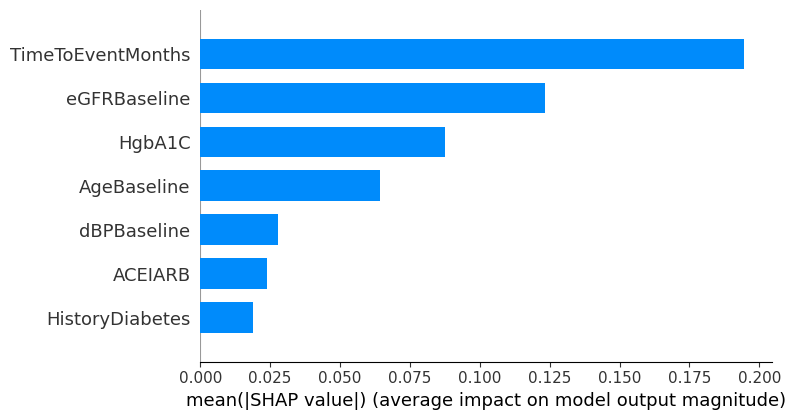

In [64]:
# SHAP Implementation
explainer = shap.Explainer(rf_model, X_train_smote)
shap_values = explainer(X_test, check_additivity=False)

# Ensure feature names are correctly set
feature_names = X_train_smote.columns

# Summary plot for the first class (assuming binary classification with labels 0 and 1)
shap.summary_plot(shap_values[:, :, 1], X_test, plot_type="bar", feature_names=feature_names, show=True)

##### Finding instances that were not predicted well by the model:

In [65]:
# Predict on the test set
predictions = rf_model.predict(X_test)
comparison = predictions == y_test.values
X_test.reset_index().index[~comparison]

Index([5, 6, 13, 15, 25, 27, 45, 48, 67, 77, 88], dtype='int64')

##### Plot SHAP (and LIME) for 4 cases of instances: one who was well predicted as 1 and one who was well predicted as 0, as well as one who was not well predicted as 1 and one who wasn't well predicted as 0.

Instance 1: Actual Label 0, Predicted Label 0


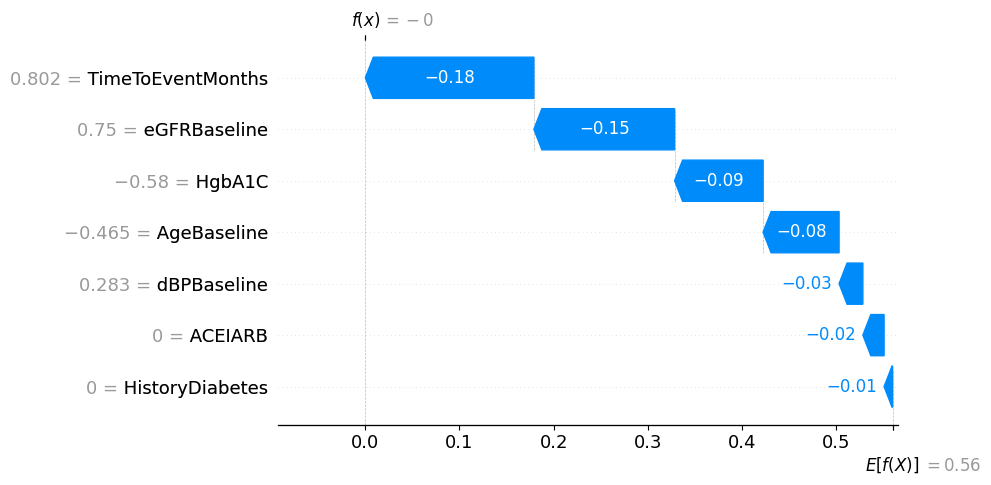

Instance 22: Actual Label 1, Predicted Label 1


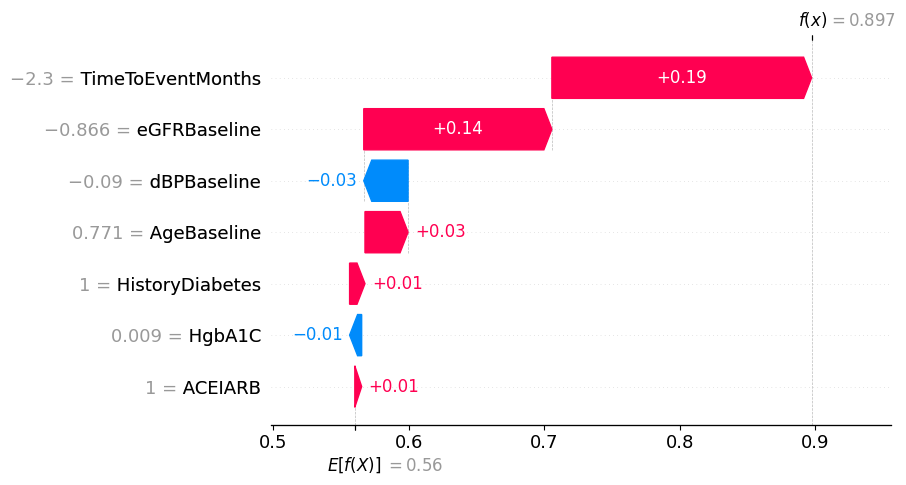

Instance 45: Actual Label 1, Predicted Label 0


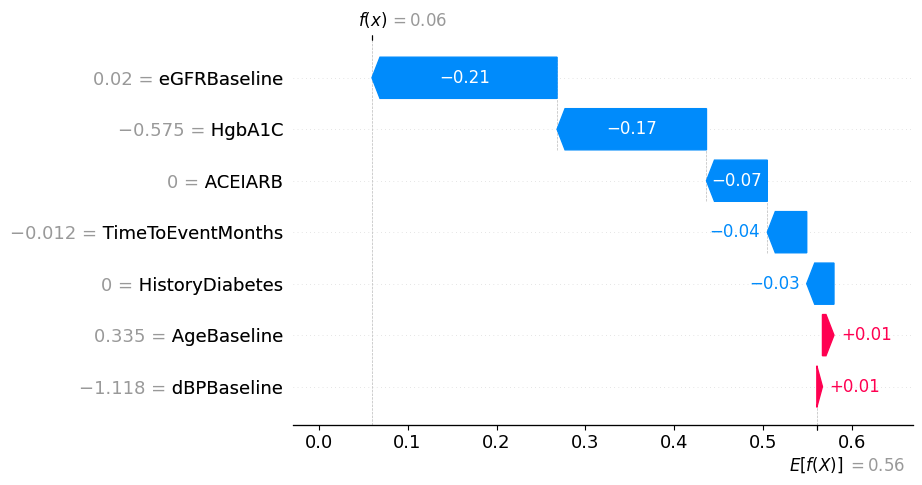

Instance 15: Actual Label 0, Predicted Label 1


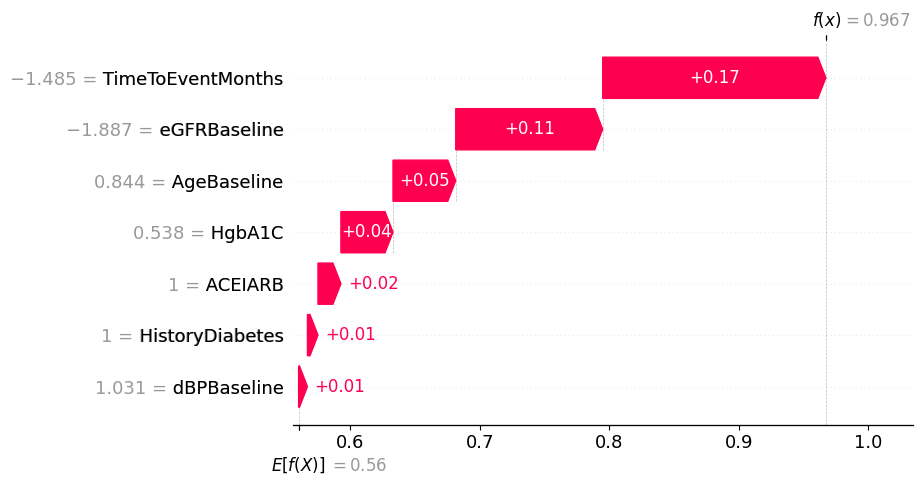

In [66]:
# Define a function to plot SHAP waterfall for a specific instance
def plot_shap_waterfall(instance_index, shap_values, feature_names, actual_label, predicted_label):
    # Create SHAP explanation object for the instance
    shap_exp = shap.Explanation(values=shap_values[instance_index][:, 1],
                                base_values=explainer.expected_value[1],
                                data=X_test.iloc[instance_index],
                                feature_names=feature_names)
    
    # Create a waterfall plot
    shap.waterfall_plot(shap_exp, max_display=10, show=True)

# Iterate through instances to plot waterfall
for instance_index in [1, 22, 45, 15]:
    # Get actual and predicted labels
    actual_label = y_test.iloc[instance_index]
    predicted_label = rf_model.predict(X_test.iloc[instance_index].values.reshape(1, -1))[0]
    
    # Print index, actual label, and predicted label
    print(f"Instance {instance_index}: Actual Label {actual_label}, Predicted Label {predicted_label}")
    
    # Plot SHAP waterfall for the instance
    plot_shap_waterfall(instance_index, shap_values, feature_names, actual_label, predicted_label)


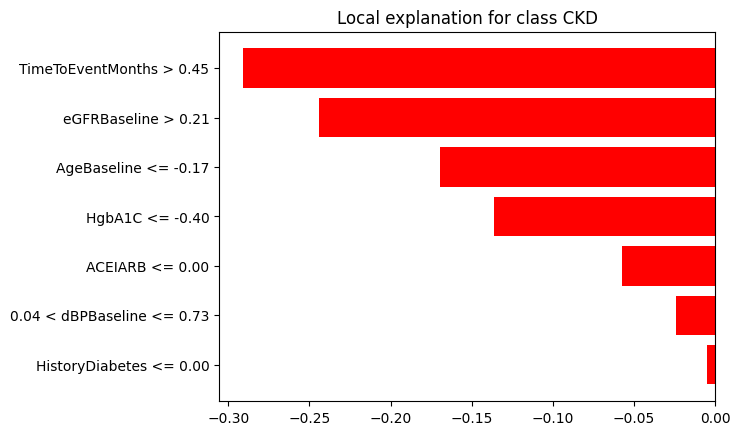

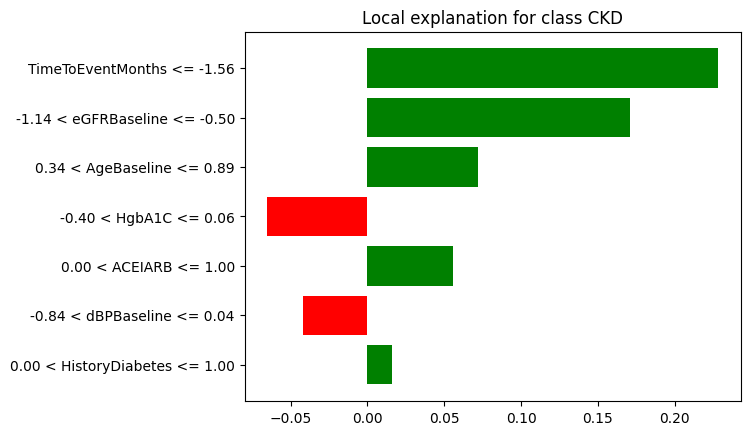

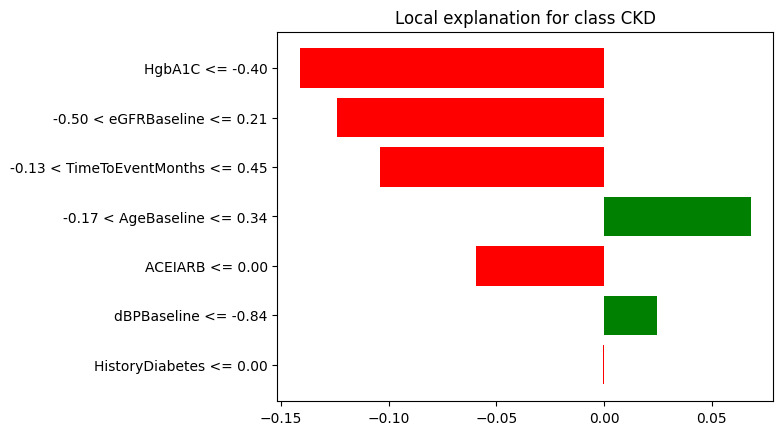

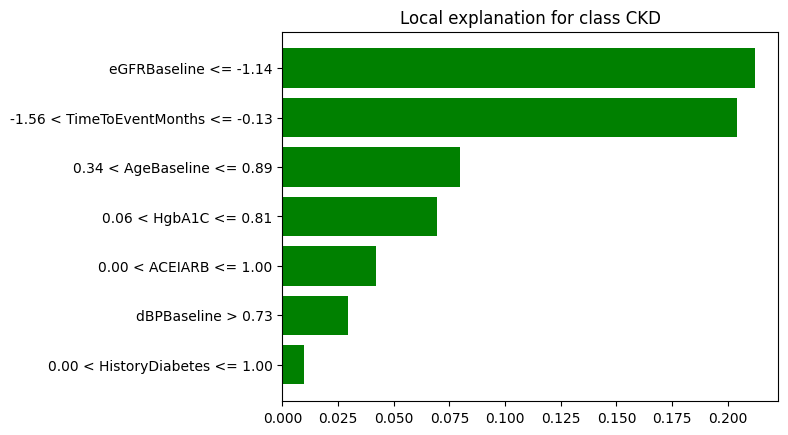

In [67]:
# LIME Implementation
explainer_lime = lime.lime_tabular.LimeTabularExplainer(X_train_smote.values, 
                                                       feature_names=feature_names,
                                                       class_names=['No CKD', 'CKD'],
                                                       discretize_continuous=True)

# I) Explaining instance without CKD in y_test that was predicted well by the model.
exp = explainer_lime.explain_instance(X_test.iloc[1].values, 
                                      rf_model.predict_proba, 
                                      num_features=10)
exp.show_in_notebook(show_table=True)
exp.as_pyplot_figure()
plt.show()

# II) Explaining instance with CKD in y_test that was predicted well by the model.
exp = explainer_lime.explain_instance(X_test.iloc[22].values, 
                                      rf_model.predict_proba, 
                                      num_features=10)
exp.show_in_notebook(show_table=True)
exp.as_pyplot_figure()
plt.show()

# III) Explaining instance with CKD in y_test that the model did not predict well.
exp = explainer_lime.explain_instance(X_test.iloc[45].values, 
                                      rf_model.predict_proba, 
                                      num_features=10)
exp.show_in_notebook(show_table=True)
exp.as_pyplot_figure()
plt.show()

# IV) Explaining instance without CKD in y_test that the model did not predict well.
exp = explainer_lime.explain_instance(X_test.iloc[15].values, 
                                      rf_model.predict_proba, 
                                      num_features=10)
exp.show_in_notebook(show_table=True)
exp.as_pyplot_figure()
plt.show()

## 6. Sub-group Analysis

### Define homogeneous group

- To find homogeneous group, we will choose 2 columns that according to litterature should have a threshold from which results in chronic kidney disease would be significant.
- We will test significance for each feature, if results are significant we will visualize the new group to see if it's homogeneous accross the features.

In [68]:
# Define thresholds for features
thresholds = {'CreatnineBaseline': 60,'HgbA1C': 6}

# Create a DataFrame to store results
results = []

# Create a subgroup based on these thresholds
subgroup = ckd.copy()
for feature, threshold in thresholds.items():
    subgroup = subgroup[subgroup[feature] > threshold]
    
def test_threshold_significance(df, feature, threshold):
    # Create groups based on the threshold
    df['ThresholdMet'] = df[feature] > threshold
    group1 = df[df['ThresholdMet'] == True]['EventCKD35']
    group2 = df[df['ThresholdMet'] == False]['EventCKD35']
    
    # Perform T-test
    t_stat, p_value = stats.ttest_ind(group1, group2, equal_var=False)
    return t_stat, p_value

# Test significance for each feature
for feature, threshold in thresholds.items():
    t_stat, p_value = test_threshold_significance(ckd, feature, threshold)
    
    # Determine if the result is significant
    significance = 'Significant' if p_value < 0.05 else 'Not Significant'
    
    # Append results
    results.append({
        'Feature': feature,
        'Threshold': threshold,
        'T-Statistic': t_stat,
        'P-Value': p_value,
        'Significance': significance
    })

# Create a DataFrame with results
results_df = pd.DataFrame(results)
results_df

,Feature,Threshold,T-Statistic,P-Value,Significance
0,CreatnineBaseline,60,5.578785,4.139095e-08,Significant
1,HgbA1C,6,5.348283,1.551339e-07,Significant


##### Visualizing homogeneity in group:

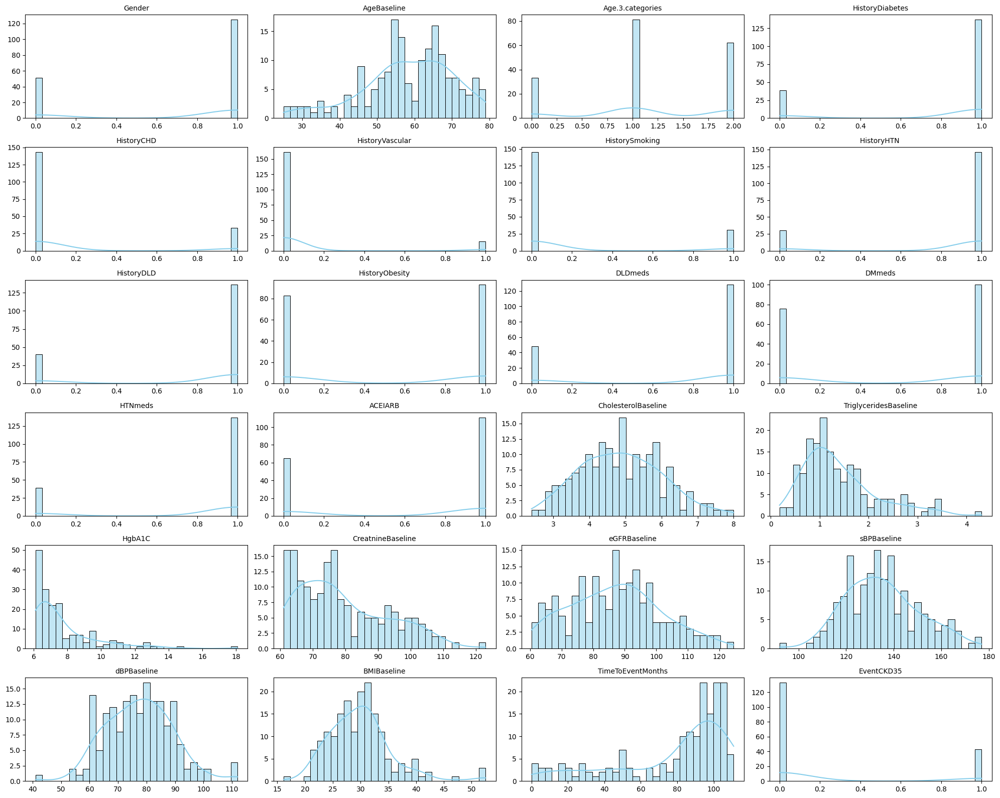

In [69]:
features_sub = ['Gender', 'AgeBaseline', 'Age.3.categories', 'HistoryDiabetes',
       'HistoryCHD', 'HistoryVascular', 'HistorySmoking', 'HistoryHTN ',
       'HistoryDLD', 'HistoryObesity', 'DLDmeds', 'DMmeds', 'HTNmeds',
       'ACEIARB', 'CholesterolBaseline', 'TriglyceridesBaseline', 'HgbA1C',
       'CreatnineBaseline', 'eGFRBaseline', 'sBPBaseline', 'dBPBaseline',
       'BMIBaseline', 'TimeToEventMonths', 'EventCKD35']

# Create a figure and axes array
fig, axes = plt.subplots(6, 4, figsize=(20, 16), sharex=False, sharey=False)

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Plot histogram for each feature
for i, feature in enumerate(features_sub):
    if i < len(axes): 
        sns.histplot(subgroup[feature], kde=True, bins=30, color='skyblue', ax=axes[i])
        axes[i].set_title(f'{feature}', fontsize=10)
        axes[i].set_xlabel('')
        axes[i].set_ylabel('')

# Turn off unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Adjust layout
plt.tight_layout()
plt.show()

### Model on Group

##### Steps of model on sub-group:
- Selecting only the features that were previously selected for the model on the whole dataset, and using the data that was preprocessed (scaled, encoded)
- Dividing the data into train and test group with the use of stratify
- Applying class imbalance using only smote technique since undersampling wouldn't get enough data
- Choosing hyperparameters thanks to cross validation
- Applying the 4 previous models on the new data, to select the best model on the data with class imbalance performed and on the regular data to compare the two
- Selecting the model with the best performance and comparing it to the performance of the previous model on the whole dataset

In [71]:
ckd_group = ckd_origin.loc[subgroup.index]
ckd_group = ckd_group[['AgeBaseline', 'HistoryDiabetes', 'ACEIARB', 'HgbA1C', 'eGFRBaseline','dBPBaseline', 'TimeToEventMonths', 'EventCKD35']]

In [72]:
X_group = ckd_group.drop(columns=['EventCKD35'])
y_group = ckd_group['EventCKD35']

# Perform stratified train-test split
X_train_group, X_test_group, y_train_group, y_test_group = train_test_split(X_group, y_group, test_size=0.2, stratify=y_group, random_state=42)

# Check the distribution of the classes
print("Train set class distribution:")
print(y_train_group.value_counts(normalize=True))
print("\nTest set class distribution:")
print(y_test_group.value_counts(normalize=True))

Train set class distribution:
EventCKD35
0    0.757143
1    0.242857
Name: proportion, dtype: float64

Test set class distribution:
EventCKD35
0    0.75
1    0.25
Name: proportion, dtype: float64


EventCKD35
0    106
1    106
Name: count, dtype: int64


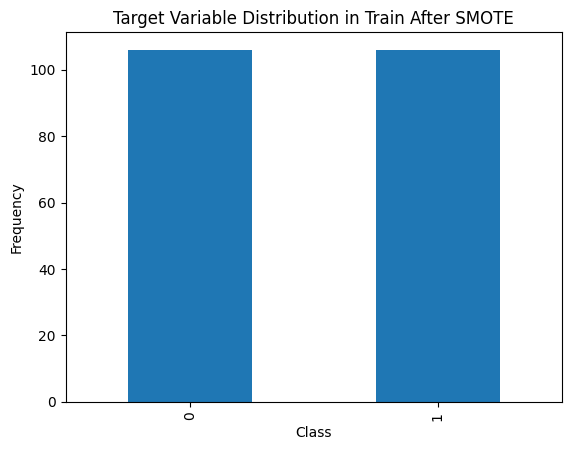

In [73]:
# Apply SMOTE
smote_group = SMOTE(k_neighbors=3, random_state=42)
X_train_smote_group, y_train_smote_group = smote_group.fit_resample(X_train_group, y_train_group)

# Analyze the new target variable distribution after SMOTE
ckd_counts_smote_group = pd.Series(y_train_smote_group).value_counts()
print(ckd_counts_smote_group)

# Plot the new target variable distribution
ckd_counts_smote_group.plot(kind='bar', title='Target Variable Distribution in Train After SMOTE')
plt.xlabel('Class')
plt.ylabel('Frequency')
plt.show()

In [74]:
# Convert the resampled data to DataFrame
X_train_smote_df_group = pd.DataFrame(X_train_smote_group, columns=X_group.columns)
y_train_smote_df_group = pd.DataFrame(y_train_smote_group, columns=['EventCKD35'])

# Combine the features and target into a single DataFrame
smote_df_group = pd.concat([X_train_smote_df_group, y_train_smote_df_group], axis=1)

smote_df_group.head()

,AgeBaseline,HistoryDiabetes,ACEIARB,HgbA1C,eGFRBaseline,dBPBaseline,TimeToEventMonths,EventCKD35
0,0.698433,1,1,0.591227,-0.163830,-0.931045,0.841228,0
1,0.625711,1,1,0.655963,-0.214998,1.964748,0.686126,0
2,1.062045,0,1,-0.285648,-0.993312,0.563558,0.453473,0
3,0.552989,1,1,2.745162,-1.577284,3.272526,-0.399587,0
4,1.352934,1,1,0.538262,-0.637907,-1.211283,0.182045,0


In [75]:
# Shuffling the dataframe 
smote_df_group = smote_df_group.sample(frac=1, random_state=42).reset_index(drop=True)

In [76]:
# Hyperparameter selection
param_grid_lr = {
    'penalty': ['l1', 'l2'],
    'C': [0.001, 0.01, 0.1, 1, 10],
    'solver': ['liblinear', 'saga']
}

param_grid_rf = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

param_grid_gb = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5]
}

param_grid_svc = {
    'C': [0.01, 1, 100],
    'kernel': ['linear', 'rbf'],
    'gamma': ['scale', 'auto']
}

# Initialize models with GridSearchCV
models_with_params_group = {
    'Logistic Regression': (LogisticRegression(max_iter=10000), param_grid_lr),
    'Random Forest': (RandomForestClassifier(), param_grid_rf),
    'Gradient Boosting': (GradientBoostingClassifier(), param_grid_gb),
    'Support Vector Machine': (SVC(probability=True), param_grid_svc)
}

# Perform Grid Search for SMOTE and regular datasets
print("Performing Grid Search on SMOTE dataset:")
best_estimators_smote_group = perform_grid_search(models_with_params_group, X_train_smote_group, y_train_smote_group)

print("\nPerforming Grid Search on Regular dataset:")
best_estimators_regular_group = perform_grid_search(models_with_params_group, X_train_group, y_train_group)

Performing Grid Search on SMOTE dataset:
Best parameters for Logistic Regression: {'C': 10, 'penalty': 'l2', 'solver': 'liblinear'}
Best parameters for Random Forest: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Best parameters for Gradient Boosting: {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 300}
Best parameters for Support Vector Machine: {'C': 100, 'gamma': 'scale', 'kernel': 'rbf'}

Performing Grid Search on Regular dataset:
Best parameters for Logistic Regression: {'C': 0.001, 'penalty': 'l2', 'solver': 'saga'}
Best parameters for Random Forest: {'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 200}
Best parameters for Gradient Boosting: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 200}
Best parameters for Support Vector Machine: {'C': 0.01, 'gamma': 'scale', 'kernel': 'rbf'}



Final Evaluation on SMOTE Test Set:

Logistic Regression on Test Set:
AUC-ROC: 0.79, F1 Score: 0.61, Recall: 0.78, Precision: 0.50


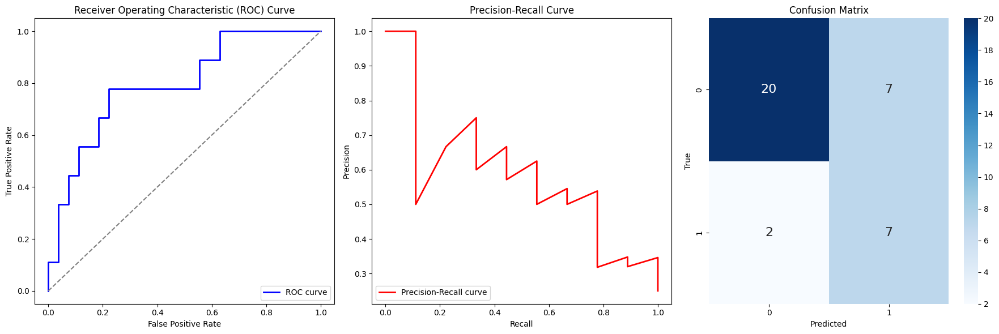


Random Forest on Test Set:
AUC-ROC: 0.86, F1 Score: 0.70, Recall: 0.78, Precision: 0.64


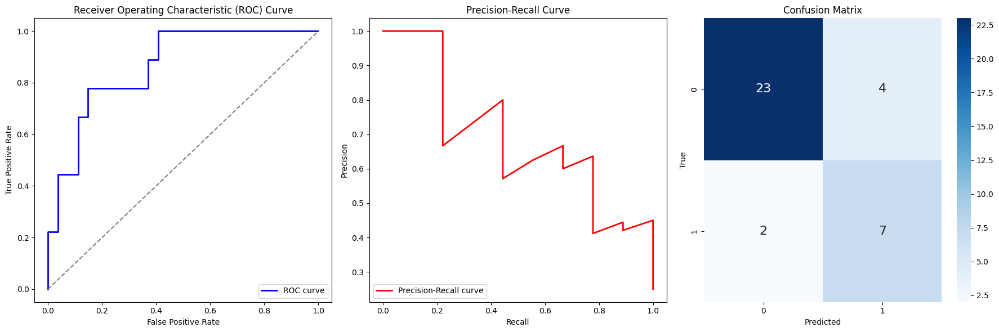


Gradient Boosting on Test Set:
AUC-ROC: 0.86, F1 Score: 0.57, Recall: 0.67, Precision: 0.50


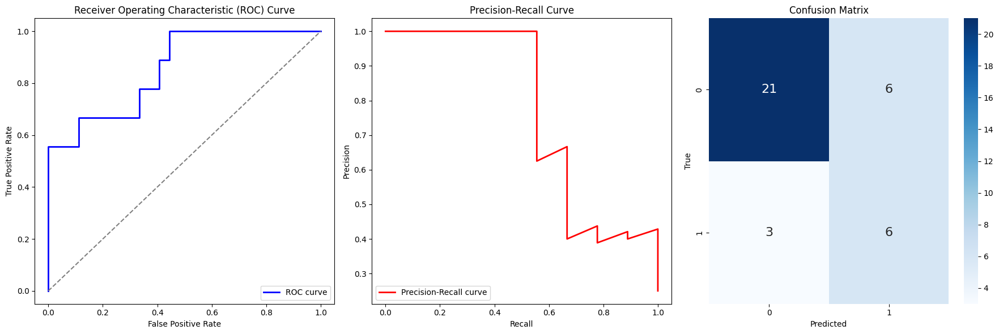


Support Vector Machine on Test Set:
AUC-ROC: 0.80, F1 Score: 0.50, Recall: 0.56, Precision: 0.45


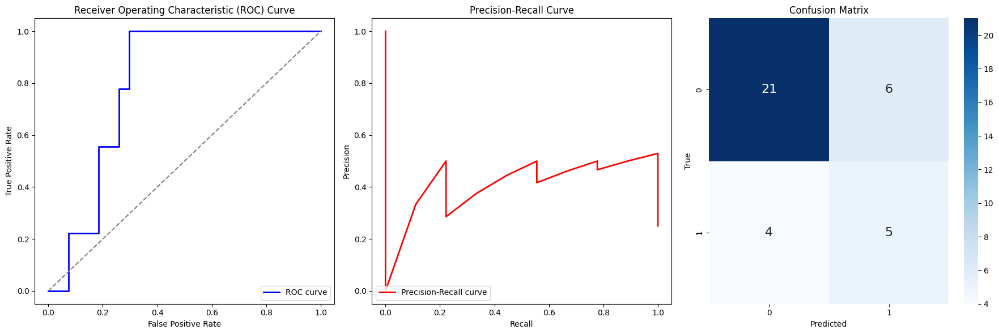


Final Evaluation on Regular Test Set:

Logistic Regression on Test Set:
AUC-ROC: 0.81, F1 Score: 0.00, Recall: 0.00, Precision: 0.00


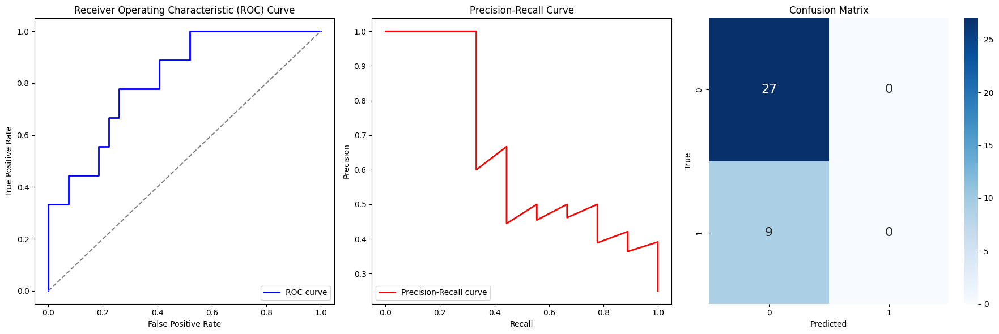


Random Forest on Test Set:
AUC-ROC: 0.85, F1 Score: 0.63, Recall: 0.67, Precision: 0.60


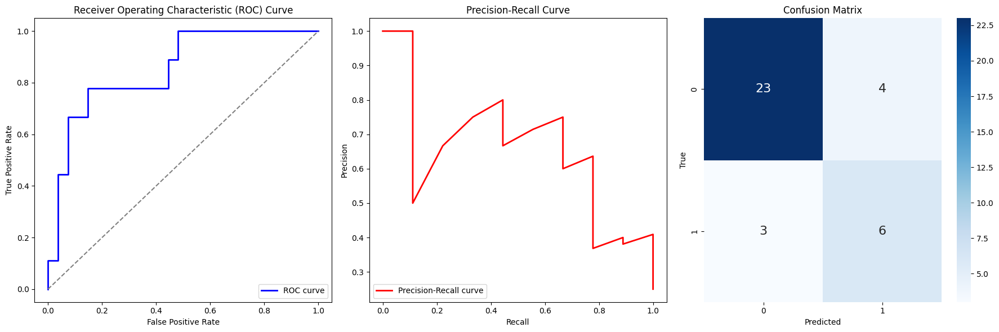


Gradient Boosting on Test Set:
AUC-ROC: 0.73, F1 Score: 0.57, Recall: 0.67, Precision: 0.50


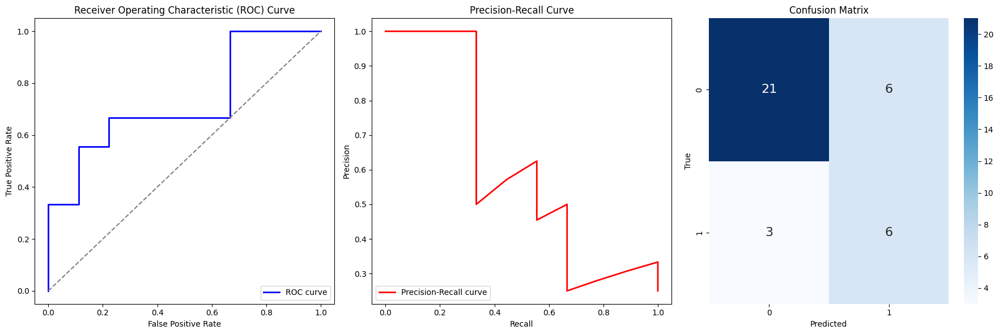


Support Vector Machine on Test Set:
AUC-ROC: 0.82, F1 Score: 0.00, Recall: 0.00, Precision: 0.00


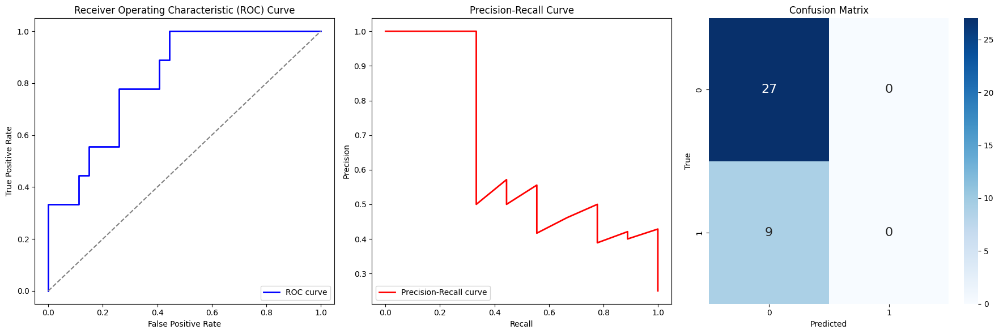


Overall Evaluation Results for SMOTE Dataset:

Model: Logistic Regression
  AUC-ROC: 0.79
  F1 Score: 0.61
  Recall: 0.78
  Precision: 0.50

Model: Random Forest
  AUC-ROC: 0.86
  F1 Score: 0.70
  Recall: 0.78
  Precision: 0.64

Model: Gradient Boosting
  AUC-ROC: 0.86
  F1 Score: 0.57
  Recall: 0.67
  Precision: 0.50

Model: Support Vector Machine
  AUC-ROC: 0.80
  F1 Score: 0.50
  Recall: 0.56
  Precision: 0.45

Overall Evaluation Results for Regular Dataset:

Model: Logistic Regression
  AUC-ROC: 0.81
  F1 Score: 0.00
  Recall: 0.00
  Precision: 0.00

Model: Random Forest
  AUC-ROC: 0.85
  F1 Score: 0.63
  Recall: 0.67
  Precision: 0.60

Model: Gradient Boosting
  AUC-ROC: 0.73
  F1 Score: 0.57
  Recall: 0.67
  Precision: 0.50

Model: Support Vector Machine
  AUC-ROC: 0.82
  F1 Score: 0.00
  Recall: 0.00
  Precision: 0.00

Best Models by Metric:

Best Model for AUC-ROC:
  SMOTE: Random Forest with 0.86
  Regular: Random Forest with 0.85

Best Model for F1 Score:
  SMOTE: Random For

In [77]:
np.random.seed(42)

def print_results(results_smote, results_regular):
    # Print SMOTE results
    print("\nOverall Evaluation Results for SMOTE Dataset:")
    for model_name, metrics in results_smote.items():
        print(f"\nModel: {model_name}")
        for metric_name, value in metrics.items():
            print(f"  {metric_name}: {value:.2f}")

    # Print Regular results
    print("\nOverall Evaluation Results for Regular Dataset:")
    for model_name, metrics in results_regular.items():
        print(f"\nModel: {model_name}")
        for metric_name, value in metrics.items():
            print(f"  {metric_name}: {value:.2f}")

    # Identify and print the best models
    best_models = {'AUC-ROC': {}, 'F1 Score': {}, 'Recall': {}, 'Precision': {}}
    for metric in best_models.keys():
        best_models[metric]['SMOTE'] = max(results_smote, key=lambda x: results_smote[x][metric])
        best_models[metric]['Regular'] = max(results_regular, key=lambda x: results_regular[x][metric])

    print("\nBest Models by Metric:")
    for metric, models in best_models.items():
        print(f"\nBest Model for {metric}:")
        for method, model in models.items():
            best_value = results_smote[model][metric] if method == 'SMOTE' else results_regular[model][metric]
            print(f"  {method}: {model} with {best_value:.2f}")

# Evaluate models on the test set
print("\nFinal Evaluation on SMOTE Test Set:")
final_metrics_smote_group = final_evaluation(best_estimators_smote_group, X_train_smote_group, X_test_group, y_train_smote_group, y_test_group)

print("\nFinal Evaluation on Regular Test Set:")
final_metrics_regular_group = final_evaluation(best_estimators_regular_group, X_train_group, X_test_group, y_train_group, y_test_group)

# Print overall evaluation results and identify best models
print_results(final_metrics_smote_group, final_metrics_regular_group)

##### According to the results, the best model is again Random Forest with a Recall of 0.78, a AUC-ROC of 0.86, a F1-score of 0.7 and a precision of 0.64.

In [78]:
rf_model_group = best_estimators_smote_group['Random Forest']

#### Comparing the results of the model on the whole dataset and the model on the subgroup:


Evaluation for Random Forest on Whole Dataset:
Random Forest - Whole Dataset - AUC-ROC: 0.90, F1 Score: 0.62, Recall: 0.82, Precision: 0.50


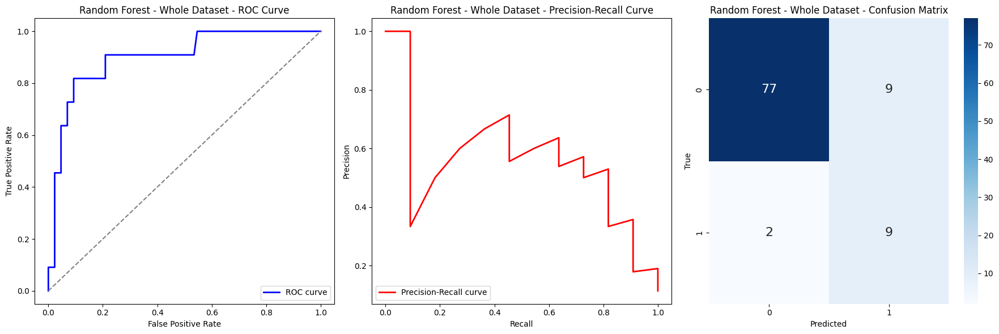


Evaluation for Random Forest on Subgroup Dataset:
Random Forest - Subgroup Dataset - AUC-ROC: 0.86, F1 Score: 0.70, Recall: 0.78, Precision: 0.64


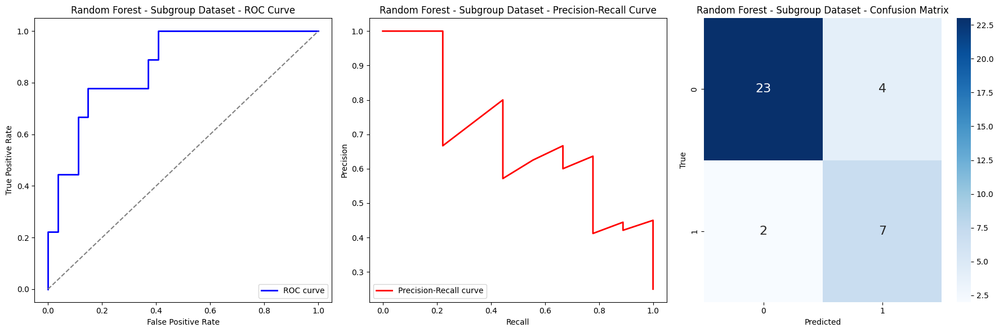

In [84]:
np.random.seed(42)

# Function to evaluate and plot metrics for a given model and dataset
def evaluate_and_plot(model, X_train, X_test, y_train, y_test, title):
    y_pred = model.predict(X_test)
    y_prob = model.predict_proba(X_test)[:, 1]

    # Calculate evaluation metrics
    auc_roc = roc_auc_score(y_test, y_prob)
    f1 = f1_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)

    # Print evaluation metrics
    print(f"{title} - AUC-ROC: {auc_roc:.2f}, F1 Score: {f1:.2f}, Recall: {recall:.2f}, Precision: {precision:.2f}")

    # Plot ROC Curve, Precision-Recall Curve, and Confusion Matrix
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    precision_vals, recall_vals, _ = precision_recall_curve(y_test, y_prob)
    cm = confusion_matrix(y_test, y_pred)

    plt.figure(figsize=(18, 6))

    plt.subplot(1, 3, 1)
    plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'{title} - ROC Curve')
    plt.legend(loc="lower right")

    plt.subplot(1, 3, 2)
    plt.plot(recall_vals, precision_vals, color='red', lw=2, label='Precision-Recall curve')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'{title} - Precision-Recall Curve')
    plt.legend(loc="lower left")

    plt.subplot(1, 3, 3)
    sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', annot_kws={"size": 16})
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f'{title} - Confusion Matrix')

    plt.tight_layout()
    plt.show()

# Evaluate and plot for the Random Forest model on both datasets
print("\nEvaluation for Random Forest on Whole Dataset:")
evaluate_and_plot(rf_model, X_train_smote, X_test, y_train_smote, y_test, "Random Forest - Whole Dataset")

print("\nEvaluation for Random Forest on Subgroup Dataset:")
evaluate_and_plot(rf_model_group, X_train_smote_group, X_test_group, y_train_smote_group, y_test_group, "Random Forest - Subgroup Dataset")
